In [1]:
#读取数据
import pandas as pd
Data=pd.read_excel('/mnt/workspace/Data/Anti_Lose.xlsx')
Data.head(10)

,age,lose,CD4/8,CD3+_value,CD3+CD8+value,CD3+CD4+_value,NK_value,B_value,CD3+%,CD3+CD8+%,...,Anti_PA,Anti_CPB,Anti_SRP,Anti_R52,Anti_SS,Anti_J1,Anti_DA,Anti_SM,Anti_PM,AnuA
0,32,2,0.96,2828.0,1340.0,1284.0,238.0,78.0,0.8992,0.4261,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴
1,31,2,1.19,1617.0,667.0,794.0,60.0,293.0,0.8195,0.3379,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴
2,33,2,1.34,986.0,394.0,528.0,667.0,64.0,0.5741,0.2296,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴
3,28,2,1.26,930.0,361.0,456.0,255.0,47.0,0.7544,0.2926,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴
4,39,3,1.34,1265.0,514.0,689.0,617.0,75.0,0.6462,0.2623,...,阴,阴,阴,阴,阴,阳,阴,阴,阴,阴
5,31,2,1.12,1033.0,456.0,509.0,284.0,53.0,0.7543,0.3332,...,阳,阴,阴,阴,阴,阴,阴,阴,阴,阴
6,32,2,1.26,1143.0,498.0,627.0,368.0,62.0,0.7258,0.3163,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴
7,33,2,1.04,1456.0,593.0,615.0,448.0,82.0,0.7322,0.2984,...,阴,阴,阴,阴,阳,阴,阴,阴,阴,阴
8,35,2,1.55,1586.0,569.0,884.0,83.0,199.0,0.8446,0.3032,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴
9,26,2,1.11,1465.0,640.0,707.0,709.0,101.0,0.6439,0.2812,...,阴,阴,阴,阴,阴,阴,阴,阴,阴,阴


数据清洗

In [2]:
#检查数据信息
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1554 entries, 0 to 1553
Data columns (total 35 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             1554 non-null   int64  
 1   lose            1553 non-null   object 
 2   CD4/8           1554 non-null   float64
 3   CD3+_value      1547 non-null   float64
 4   CD3+CD8+value   1547 non-null   float64
 5   CD3+CD4+_value  1547 non-null   float64
 6   NK_value        1547 non-null   float64
 7   B_value         1547 non-null   float64
 8   CD3+%           1554 non-null   float64
 9   CD3+CD8+%       1554 non-null   float64
 10  CD3+CD4+%       1554 non-null   float64
 11  NK%             1554 non-null   float64
 12  B%              1554 non-null   float64
 13  Anti_J          1251 non-null   object 
 14  Anti_Z          1251 non-null   object 
 15  Anti_N          1251 non-null   object 
 16  Anti_ATOAb      1368 non-null   object 
 17  Anti_Total      1404 non-null   o

In [3]:
#统计空缺数据
Data.isnull().sum()

age                 0
lose                1
CD4/8               0
CD3+_value          7
CD3+CD8+value       7
CD3+CD4+_value      7
NK_value            7
B_value             7
CD3+%               0
CD3+CD8+%           0
CD3+CD4+%           0
NK%                 0
B%                  0
Anti_J            303
Anti_Z            303
Anti_N            303
Anti_ATOAb        186
Anti_Total        150
Anti_H            150
Anti_A1           268
Anti_S7           150
Anti_SA           150
Anti_X            150
Anti_HP           150
Anti_ZP           150
Anti_PA           150
Anti_CPB          150
Anti_SRP          150
Anti_R52          150
Anti_SS           150
Anti_J1           150
Anti_DA           150
Anti_SM           150
Anti_PM           150
AnuA              147
dtype: int64

In [4]:
#统计空缺数据信息
Null_label=['lose','CD3+_value','CD3+CD8+value','CD3+CD4+_value','NK_value','B_value']
for label in Null_label:
    print(Data[label].value_counts())

lose
2          959
3          230
1          135
0          118
4           72
5           25
6            6
7            5
9            1
2；5月后妊娠      1
11           1
Name: count, dtype: int64
CD3+_value
1226.0    7
1143.0    7
1342.0    7
1029.0    7
1377.0    6
         ..
707.0     1
1713.0    1
1398.0    1
1277.0    1
1090.0    1
Name: count, Length: 899, dtype: int64
CD3+CD8+value
477.0    10
385.0     9
421.0     9
320.0     9
443.0     9
         ..
213.0     1
790.0     1
551.0     1
530.0     1
947.0     1
Name: count, Length: 610, dtype: int64
CD3+CD4+_value
829.0     10
665.0      9
565.0      8
659.0      8
651.0      8
          ..
1505.0     1
498.0      1
408.0      1
457.0      1
826.0      1
Name: count, Length: 693, dtype: int64
NK_value
267.0    11
206.0    10
260.0     9
268.0     9
218.0     9
         ..
869.0     1
384.0     1
948.0     1
886.0     1
663.0     1
Name: count, Length: 596, dtype: int64
B_value
163.0    16
185.0    14
193.0    14
164.0    14
213.

In [5]:
#补充空缺数据
Fillna_list=[2,1226.0,477.0,829.0,267.0,163.0]
for label,fillna in zip(Null_label,Fillna_list):
    Data[label].fillna(fillna,inplace=True)
Data.isnull().sum()

age                 0
lose                0
CD4/8               0
CD3+_value          0
CD3+CD8+value       0
CD3+CD4+_value      0
NK_value            0
B_value             0
CD3+%               0
CD3+CD8+%           0
CD3+CD4+%           0
NK%                 0
B%                  0
Anti_J            303
Anti_Z            303
Anti_N            303
Anti_ATOAb        186
Anti_Total        150
Anti_H            150
Anti_A1           268
Anti_S7           150
Anti_SA           150
Anti_X            150
Anti_HP           150
Anti_ZP           150
Anti_PA           150
Anti_CPB          150
Anti_SRP          150
Anti_R52          150
Anti_SS           150
Anti_J1           150
Anti_DA           150
Anti_SM           150
Anti_PM           150
AnuA              147
dtype: int64

In [6]:
#处理抗体空缺数据
for Anti_tabel in Data.iloc[:,13:].columns:
    Data[Anti_tabel].fillna('阴',inplace=True)
Data.isnull().sum()

age               0
lose              0
CD4/8             0
CD3+_value        0
CD3+CD8+value     0
CD3+CD4+_value    0
NK_value          0
B_value           0
CD3+%             0
CD3+CD8+%         0
CD3+CD4+%         0
NK%               0
B%                0
Anti_J            0
Anti_Z            0
Anti_N            0
Anti_ATOAb        0
Anti_Total        0
Anti_H            0
Anti_A1           0
Anti_S7           0
Anti_SA           0
Anti_X            0
Anti_HP           0
Anti_ZP           0
Anti_PA           0
Anti_CPB          0
Anti_SRP          0
Anti_R52          0
Anti_SS           0
Anti_J1           0
Anti_DA           0
Anti_SM           0
Anti_PM           0
AnuA              0
dtype: int64

In [7]:
#替换Lose列错误信息
Data['lose'].replace('2；5月后妊娠',0,inplace=True)

In [8]:
#转化数据类型
Encoder_label={'阴':0,'阳':1}
for Anti_Target in Data.iloc[:,13:].columns:
    Data[Anti_Target+'_Encoder']=Data.loc[:,Anti_Target].map(Encoder_label)
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1554 entries, 0 to 1553
Data columns (total 57 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 1554 non-null   int64  
 1   lose                1554 non-null   int64  
 2   CD4/8               1554 non-null   float64
 3   CD3+_value          1554 non-null   float64
 4   CD3+CD8+value       1554 non-null   float64
 5   CD3+CD4+_value      1554 non-null   float64
 6   NK_value            1554 non-null   float64
 7   B_value             1554 non-null   float64
 8   CD3+%               1554 non-null   float64
 9   CD3+CD8+%           1554 non-null   float64
 10  CD3+CD4+%           1554 non-null   float64
 11  NK%                 1554 non-null   float64
 12  B%                  1554 non-null   float64
 13  Anti_J              1554 non-null   object 
 14  Anti_Z              1554 non-null   object 
 15  Anti_N              1554 non-null   object 
 16  Anti_A

分析NK细胞与抗体的关系-统计学分析

In [9]:
#正态性检验
from scipy.stats import normaltest
from pandas import DataFrame
NormalResult=DataFrame()    #正态检验结果
Label,Normal_Stats,Normal_P_value=[],[],[]
for label in Data.iloc[:,:13].columns:
    normal_stats,normal_Pvalue=normaltest(Data.loc[:,label])    #正态检验
    print('{0}正态检验统计量为:{1},P值为:{2}'.format(label,normal_stats,normal_Pvalue))
    Label.append(label)
    Normal_Stats.append(normal_stats)
    Normal_P_value.append(normal_Pvalue)
NormalResult['Label']=Label
NormalResult['Stats']=Normal_Stats
NormalResult['P value']=Normal_P_value

age正态检验统计量为:39.29401764039019,P值为:2.9336782664890117e-09
lose正态检验统计量为:450.54681616709144,P值为:1.4621837389549723e-98
CD4/8正态检验统计量为:370.3242369670948,P值为:3.8469246964819935e-81
CD3+_value正态检验统计量为:1082.9090578959915,P值为:7.067826441323702e-236
CD3+CD8+value正态检验统计量为:454.34559725406655,P值为:2.188301297003773e-99
CD3+CD4+_value正态检验统计量为:467.8294047994932,P值为:2.583066052112616e-102
NK_value正态检验统计量为:510.4512620573461,P值为:1.4352144688173046e-111
B_value正态检验统计量为:654.5038842467234,P值为:7.521203573230229e-143
CD3+%正态检验统计量为:419.29607404997483,P值为:8.933350589120362e-92
CD3+CD8+%正态检验统计量为:186.51105292644303,P值为:3.159653436321885e-41
CD3+CD4+%正态检验统计量为:65.60645518249544,P值为:5.672039786004309e-15
NK%正态检验统计量为:189.53691914098124,P值为:6.95954664671995e-42
B%正态检验统计量为:852.6266705630856,P值为:7.1527150746711885e-186


In [10]:
#输出正态检验结果Excel文件
NormalResult.to_excel('/mnt/workspace/Analysis_Result/NormalResult.xlsx','UTF-8')

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


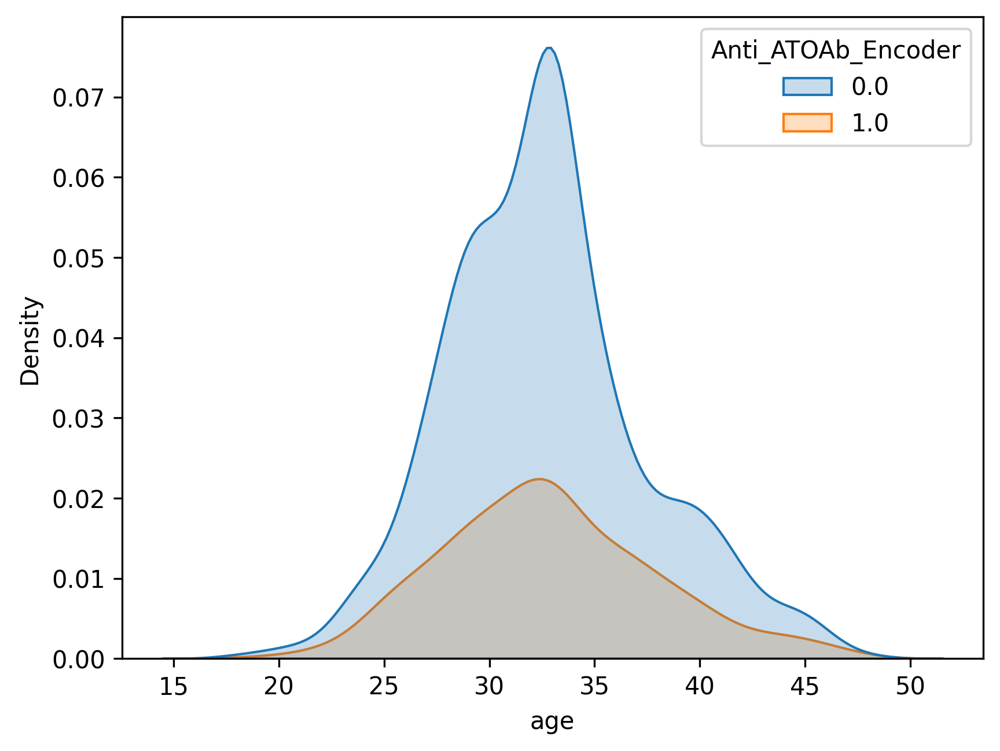

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


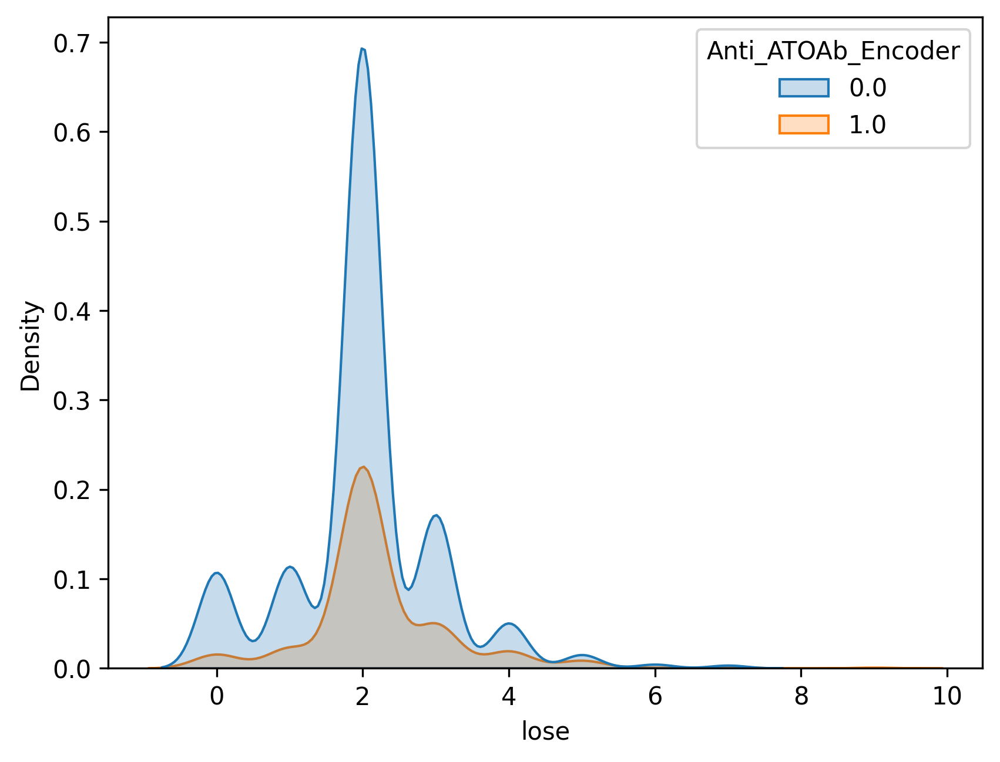

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


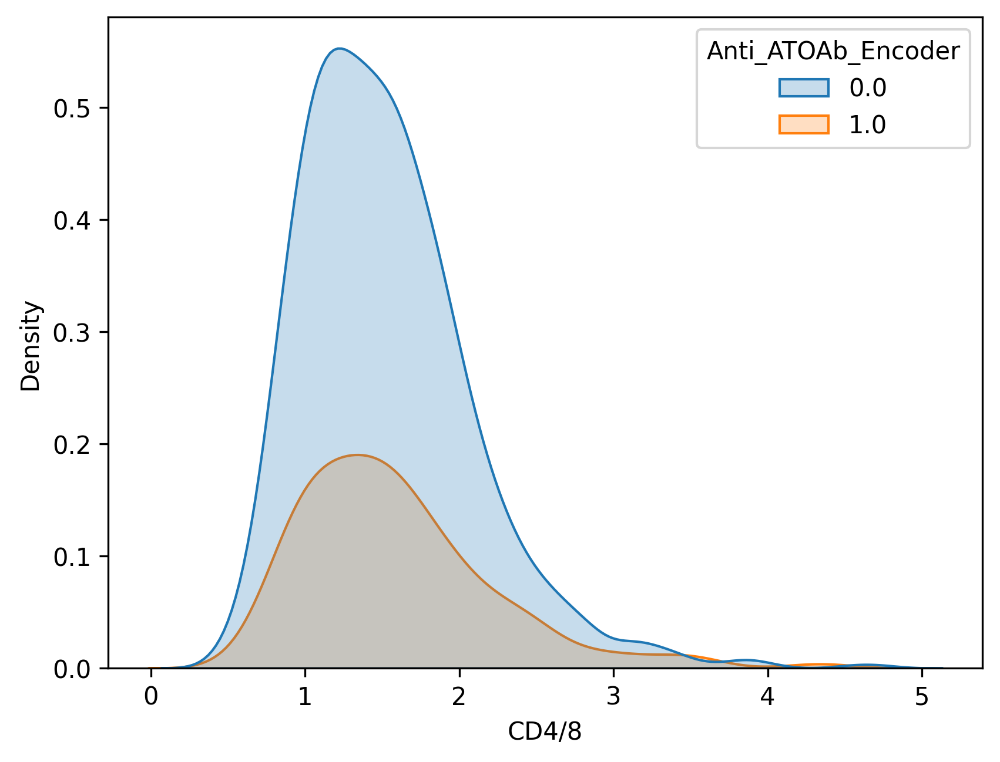

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


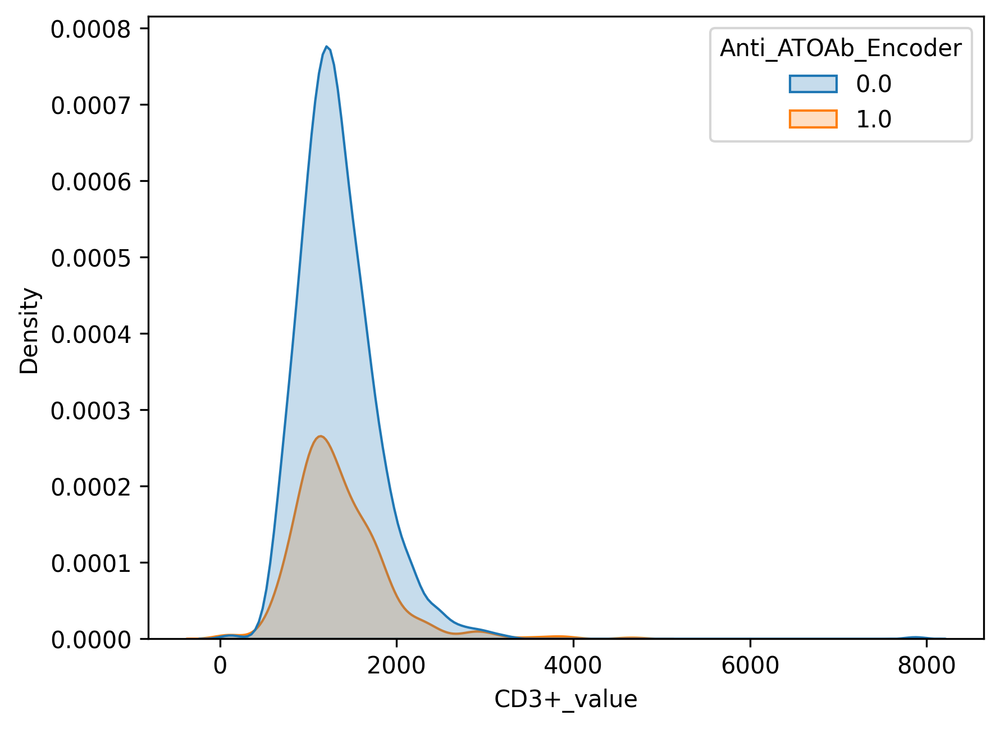

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


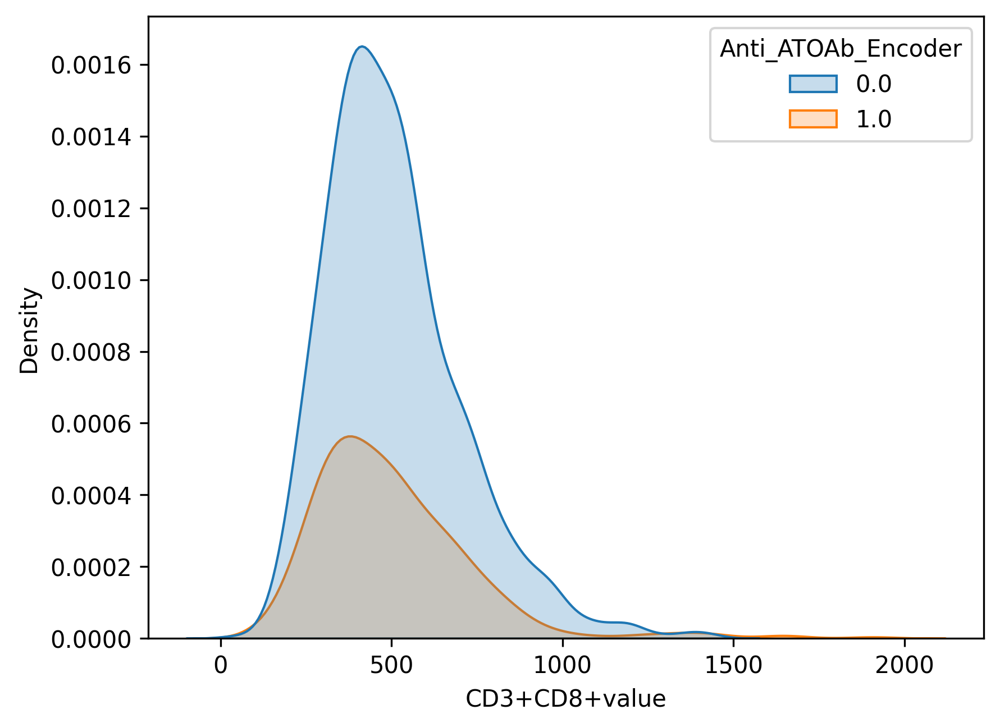

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


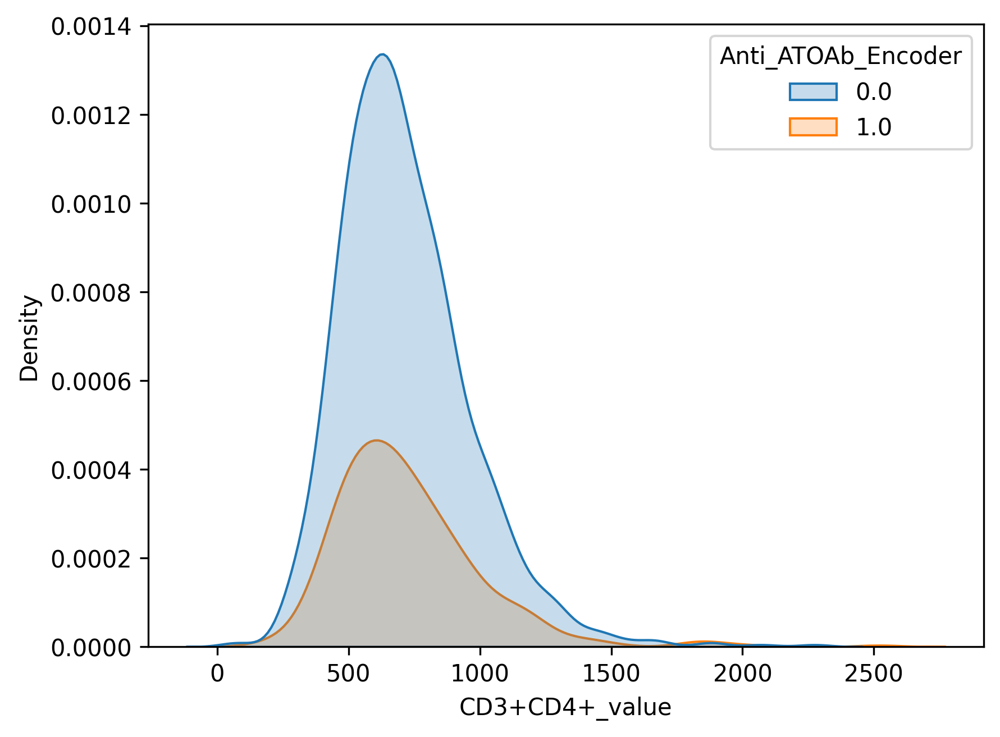

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


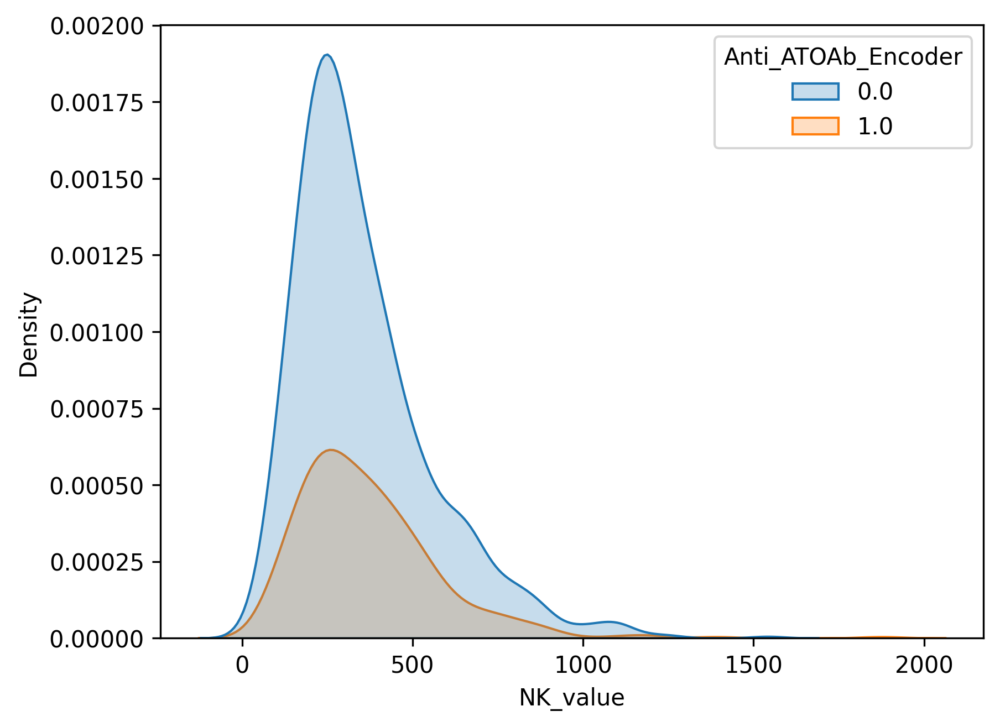

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


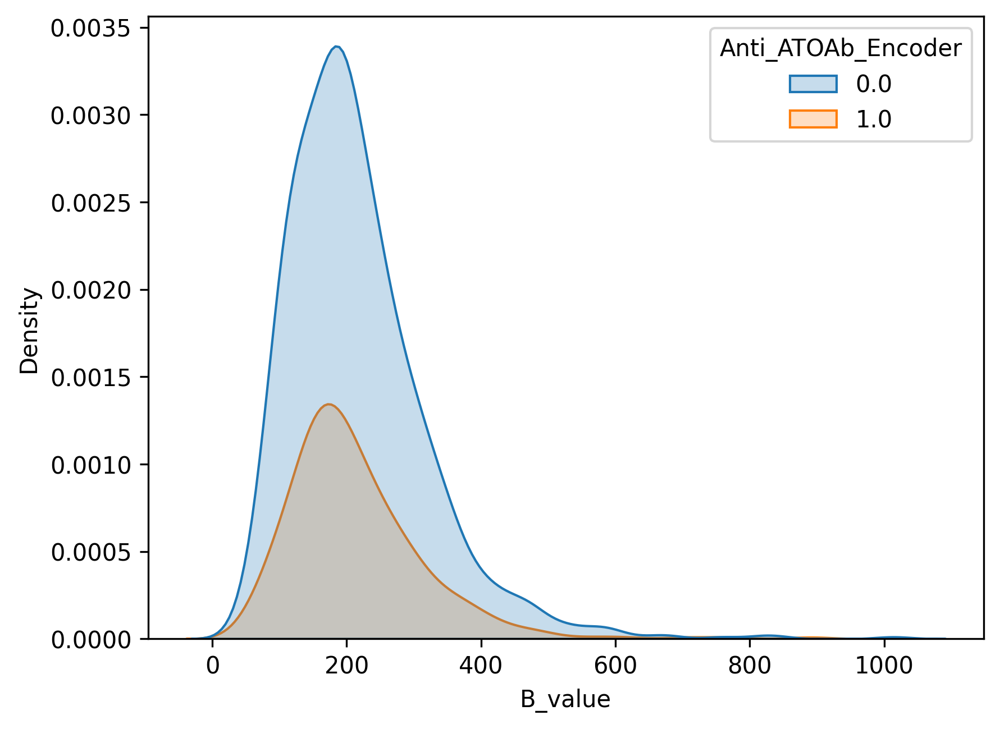

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


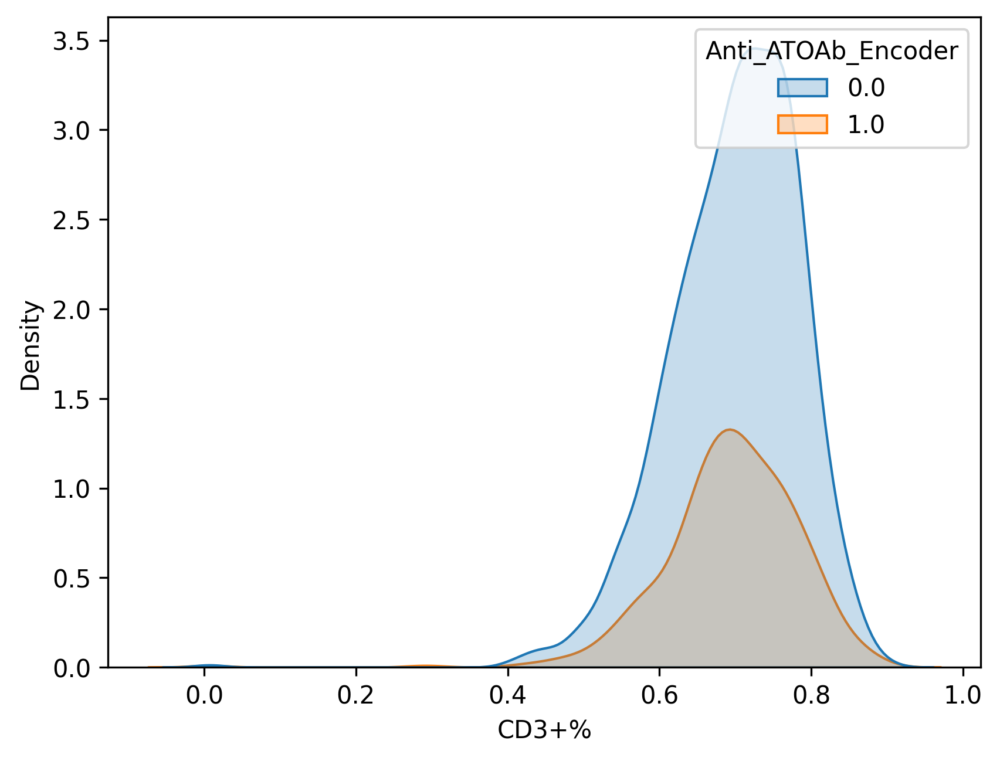

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


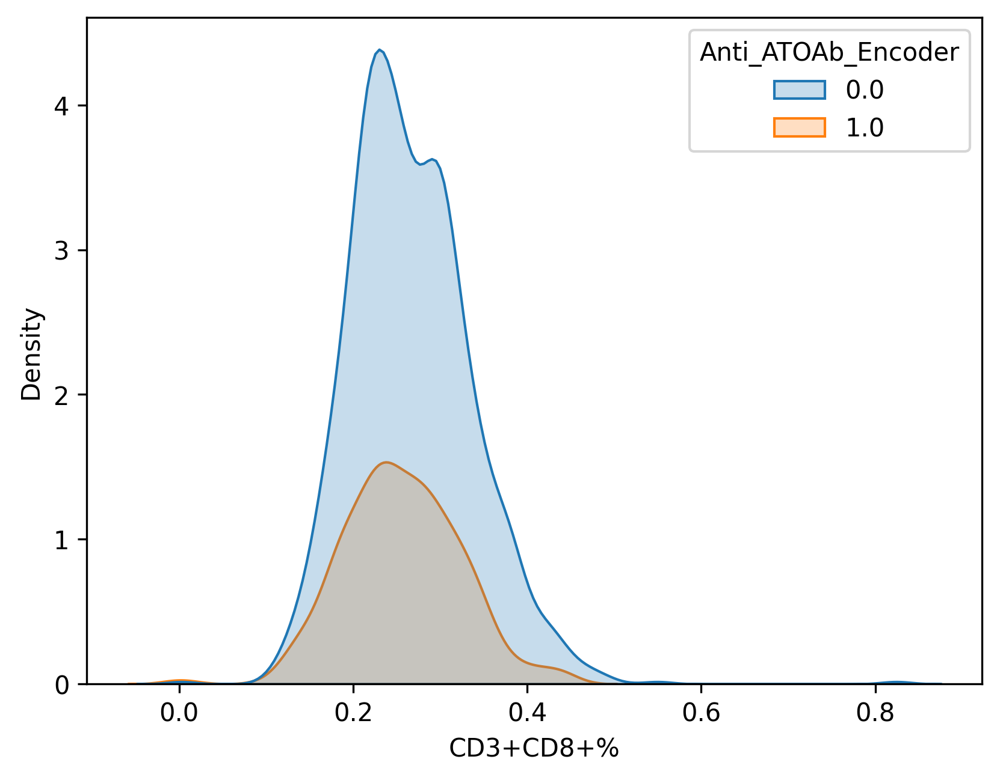

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


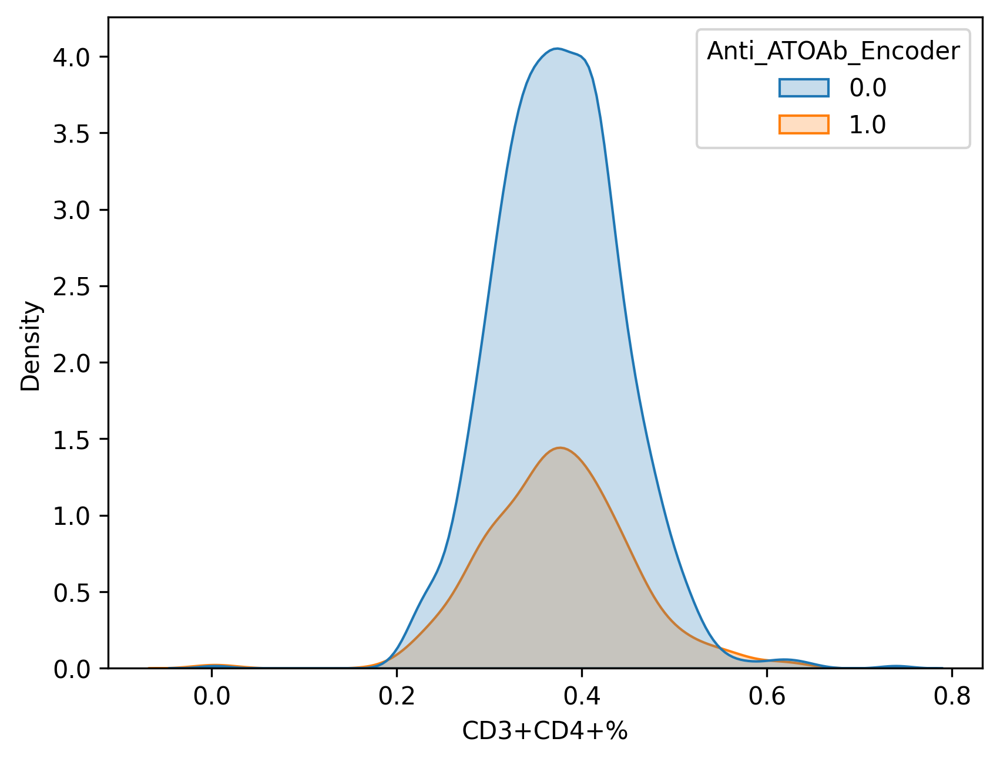

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


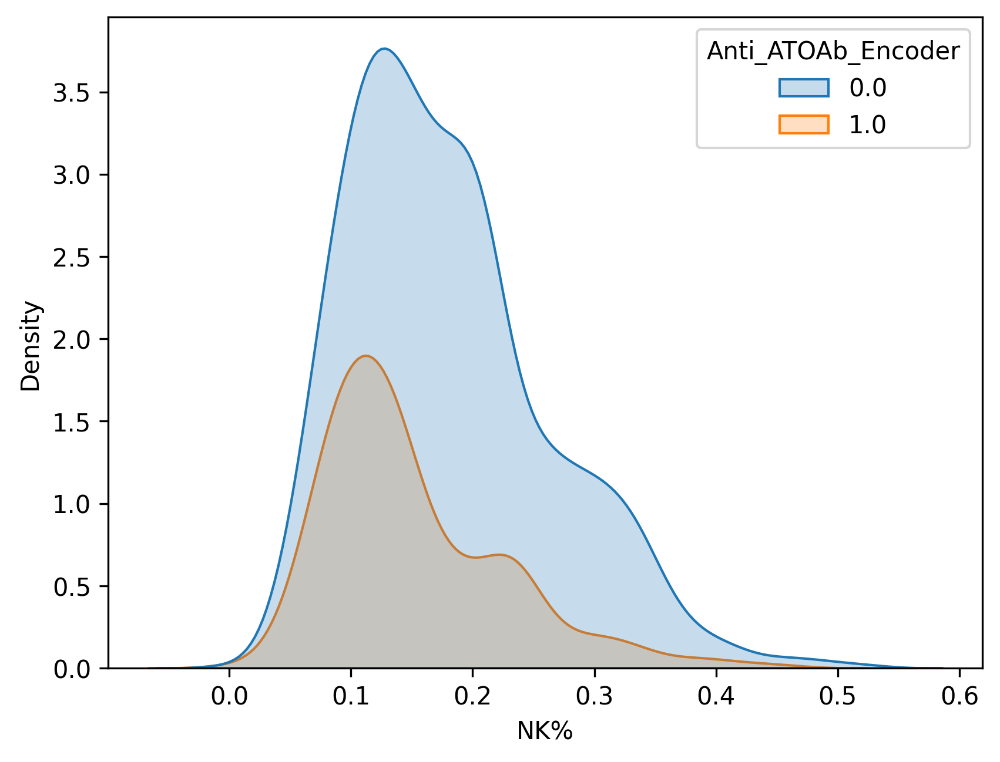

/tmp/ipykernel_497/4274156371.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')


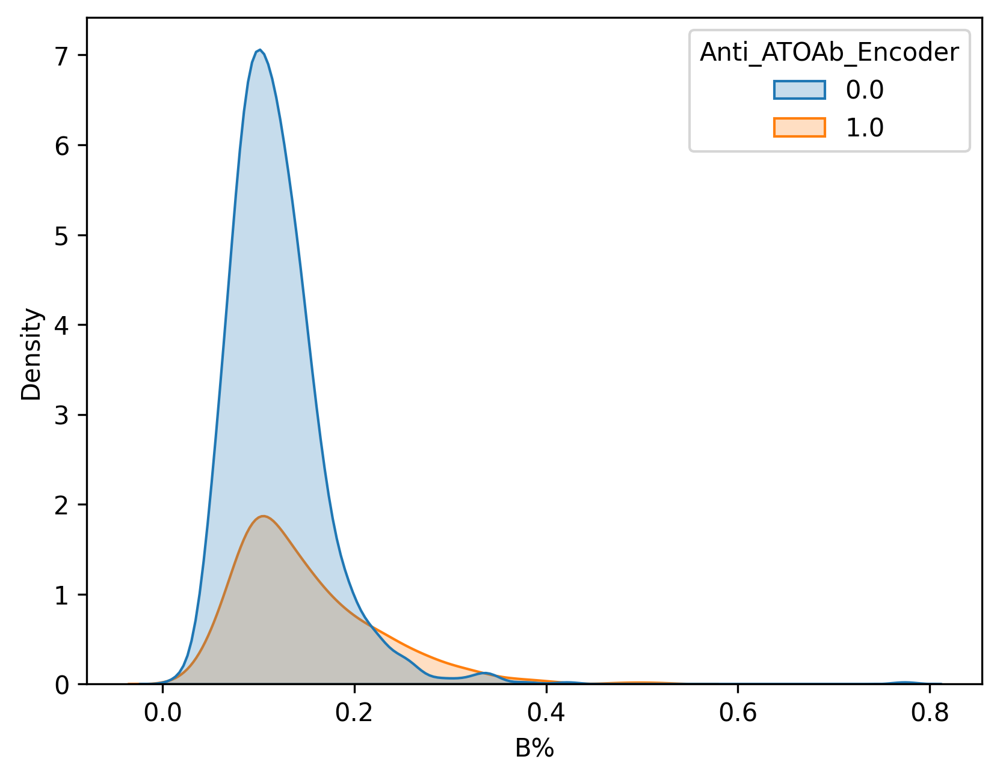

In [11]:
#绘制核密度估计图
import seaborn as sns
import matplotlib.pyplot as plt
for label in Data.iloc[:,:13].columns:
    plt.figure(dpi=300)
    sns.kdeplot(x=label,data=Data,shade=True,hue='Anti_ATOAb_Encoder')
    plt.show()

In [12]:
#进行差异分析
from scipy.stats import mannwhitneyu
MannWhitneyU_Result=DataFrame()
MannWhitney_label=[]
MannWhitney_Stats=[]
MannWhitney_Pvalue=[]
for Anti_name in Data.iloc[:,35:].columns:
    Different_Data_1=Data.loc[Data.loc[:,Anti_name]==0,'NK%']     #阴性结果
    Different_Data_2=Data.loc[Data.loc[:,Anti_name]==1,'NK%']    #阳性结果
    MannWhitney_stats,MannWhitney_pavlue=mannwhitneyu(Different_Data_1,Different_Data_2)
    MannWhitney_label.append(Anti_name)
    MannWhitney_Stats.append(MannWhitney_stats)
    MannWhitney_Pvalue.append(MannWhitney_pavlue)
MannWhitneyU_Result['label']=MannWhitney_label
MannWhitneyU_Result['Stats']=MannWhitney_Stats
MannWhitneyU_Result['P value']=MannWhitney_Pvalue
MannWhitneyU_Result

,label,Stats,P value
0,Anti_J_Encoder,97404.0,3.308324e-01
1,Anti_Z_Encoder,46495.0,4.957805e-04
2,Anti_N_Encoder,25183.5,5.491163e-05
3,Anti_ATOAb_Encoder,264252.0,4.257427e-11
4,Anti_Total_Encoder,262336.5,2.701199e-01
5,Anti_H_Encoder,128286.5,3.230293e-03
6,Anti_A1_Encoder,980.0,6.508957e-01
7,Anti_S7_Encoder,18897.5,5.457556e-01
8,Anti_SA_Encoder,60157.0,8.905951e-01
9,Anti_X_Encoder,24612.5,2.933292e-01


In [13]:
#输出MannWhitneyU检验结果
MannWhitneyU_Result.to_excel('/mnt/workspace/Analysis_Result/MannWhitneyU_Result.xlsx','UTF-8')

/tmp/ipykernel_497/2011717561.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x='NK%',hue='Anti_ATOAb_Encoder',data=Data,shade=True)


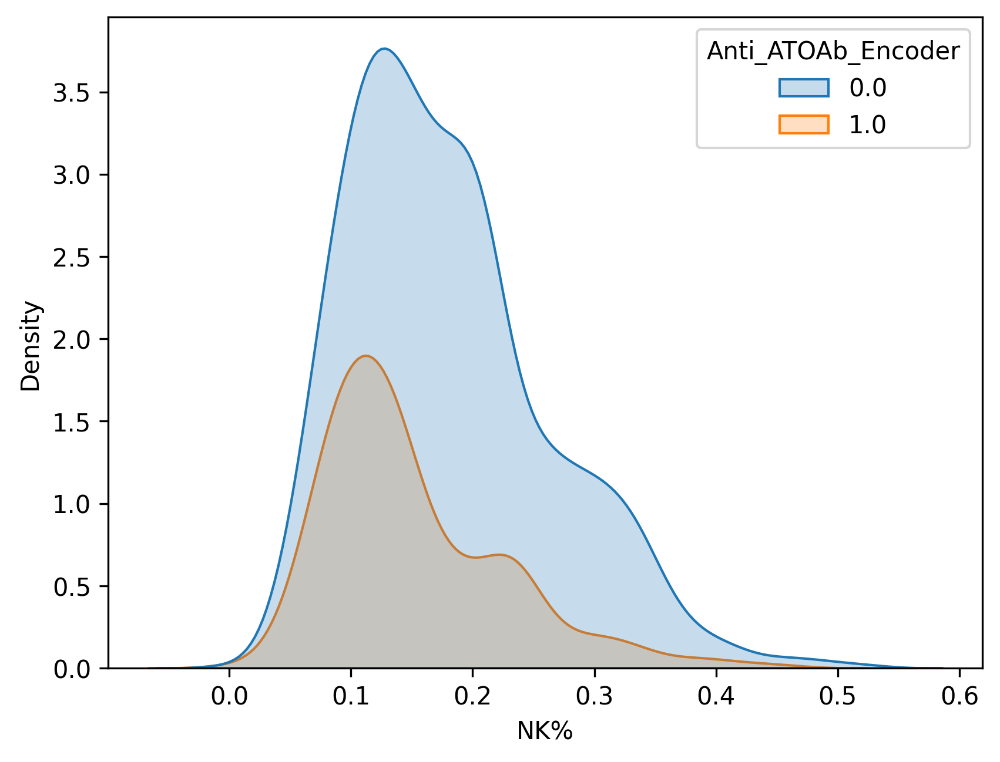

In [14]:
#查看甲状腺抗体导致流产的差异性
plt.figure(dpi=300)
sns.kdeplot(x='NK%',hue='Anti_ATOAb_Encoder',data=Data,shade=True)
plt.show()

In [15]:
#计算Spearman秩和检验
from scipy.stats import spearmanr
Spearman_Result=DataFrame()
Spearman_Label,Spearman_Stats,Spearman_Pvalue=[],[],[]
for anti_name in Data.iloc[:,35:].columns:
    spearman_stats,spearman_pvalue=spearmanr(Data.loc[:,'NK%'],Data.loc[:,anti_name])
    Spearman_Label.append(anti_name)
    Spearman_Stats.append(spearman_stats)
    Spearman_Pvalue.append(spearman_pvalue)
Spearman_Result['Label']=Spearman_Label
Spearman_Result['Corralition']=Spearman_Stats
Spearman_Result['P value']=Spearman_Pvalue
Spearman_Result

,Label,Corralition,P value
0,Anti_J_Encoder,NaN,NaN
1,Anti_Z_Encoder,NaN,NaN
2,Anti_N_Encoder,NaN,NaN
3,Anti_ATOAb_Encoder,NaN,NaN
4,Anti_Total_Encoder,NaN,NaN
5,Anti_H_Encoder,NaN,NaN
6,Anti_A1_Encoder,-0.011511,0.650240
7,Anti_S7_Encoder,-0.015336,0.545770
8,Anti_SA_Encoder,NaN,NaN
9,Anti_X_Encoder,NaN,NaN


分析NK细胞与抗体的关系-机器学习

In [16]:
#数据集划分
from sklearn.model_selection import train_test_split
Anti_Data=Data.iloc[:,35:]    #提取抗体数据
NK_per=Data.loc[:,'NK%']    #NK细胞比例
NK_TrainData,NK_TestData,NK_TrainTarget,NK_TestTarget=train_test_split(Anti_Data,NK_per,train_size=0.7,random_state=2024)
print('训练数据集形状:{0},测试数据集为:{1}'.format(NK_TrainData.shape,NK_TestData.shape))
print('训练数据集标签形状:{0},测试数据集标签为:{1}'.format(NK_TrainTarget.shape,NK_TestTarget.shape))

训练数据集形状:(1087, 22),测试数据集为:(467, 22)
训练数据集标签形状:(1087,),测试数据集标签为:(467,)


In [17]:
#载入XGBoost模型
import xgboost
NK_XGBoost=xgboost.XGBRegressor(booster='gbtree',objective='reg:squarederror',n_estimators=9,
                                  min_child_weight=0.1,max_depth=3,tree_method='gpu_hist',n_jobs=-1,
                                 random_state=2024)
NK_XGBoost.fit(NK_TrainData,NK_TrainTarget)

/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [10:55:29] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=0.1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=9, n_jobs=-1,
             num_parallel_tree=None, random_state=2024, ...)

In [128]:
#保存模型
import joblib
joblib.dump(NK_XGBoost,'/mnt/workspace/ML_Model/ML_Models_lose/NK_XGBoost.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/NK_XGBoost.pkl']

In [18]:
#评估训练结果
from sklearn.metrics import mean_squared_error,mean_absolute_error
def Model_Error(X_train,X_test,y_train,y_test,model):
    Train_mse=mean_squared_error(y_train,model.predict(X_train))    #计算训练MSE
    Test_mse=mean_squared_error(y_test,model.predict(X_test))    #计算测试MSE
    print('模型训练MSE为:{0},模型测试MSE为:{1}'.format(Train_mse,Test_mse))
    Train_mae=mean_absolute_error(y_train,model.predict(X_train))    #计算训练MAE
    Test_mae=mean_absolute_error(y_test,model.predict(X_test))    #计算测试MAE
    print('模型训练MAE为:{0},模型测试MAE为:{1}'.format(Train_mae,Test_mae))

In [19]:
Model_Error(NK_TrainData,NK_TestData,NK_TrainTarget,NK_TestTarget,NK_XGBoost)

模型训练MSE为:0.0057273290785749735,模型测试MSE为:0.007342678606902672
模型训练MAE为:0.05947209172707473,模型测试MAE为:0.06694635073273188


/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [10:55:37] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [10:55:37] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


In [20]:
#计算SHAP
import shap
NK_XGBoost_Explainer=shap.TreeExplainer(NK_XGBoost)
NK_Shap=NK_XGBoost_Explainer.shap_values(NK_TestData)    #计算SHAP图
NK_expected_value=NK_XGBoost_Explainer.expected_value    #计算expected_value

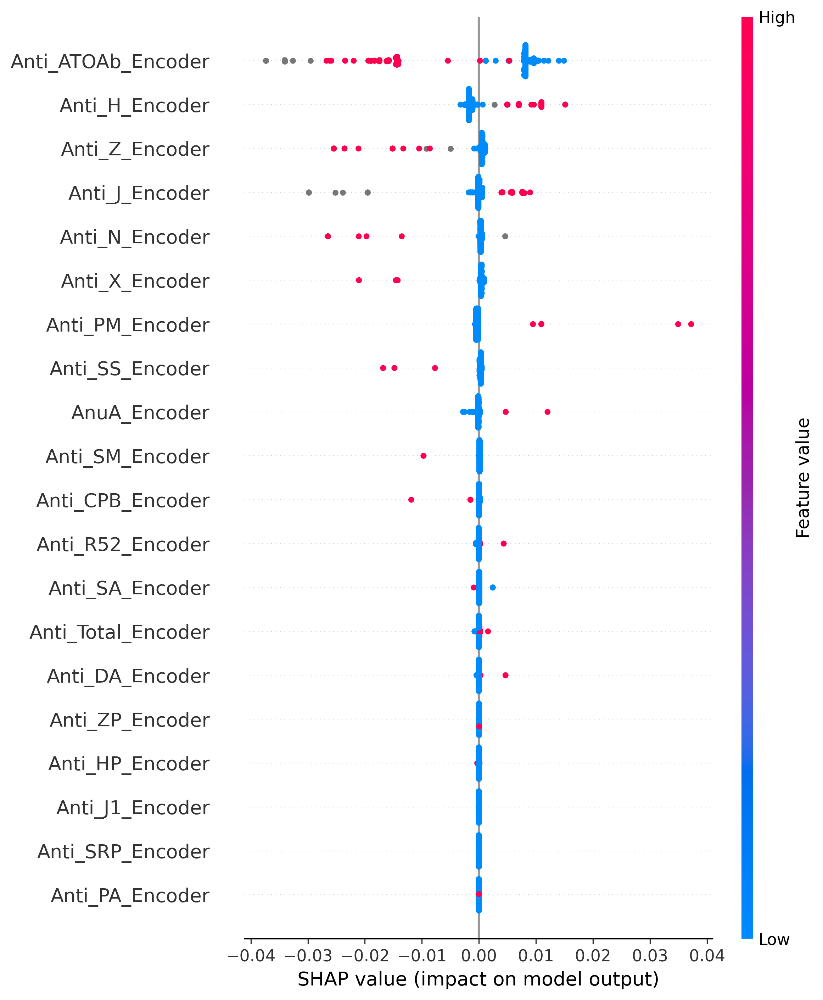

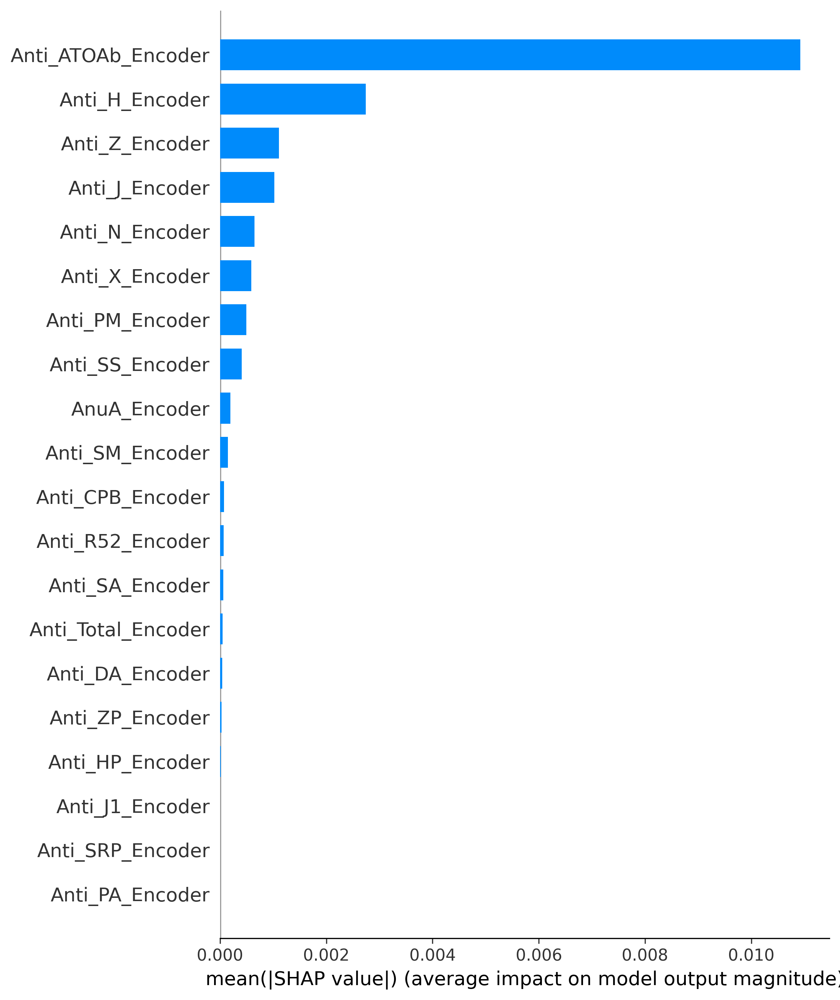

In [21]:
#绘制summary_plot图
plt.figure(dpi=300)
shap.summary_plot(NK_Shap,NK_TestData)
plt.show()
plt.figure(dpi=300)
shap.summary_plot(NK_Shap,NK_TestData,plot_type='bar')
plt.show()

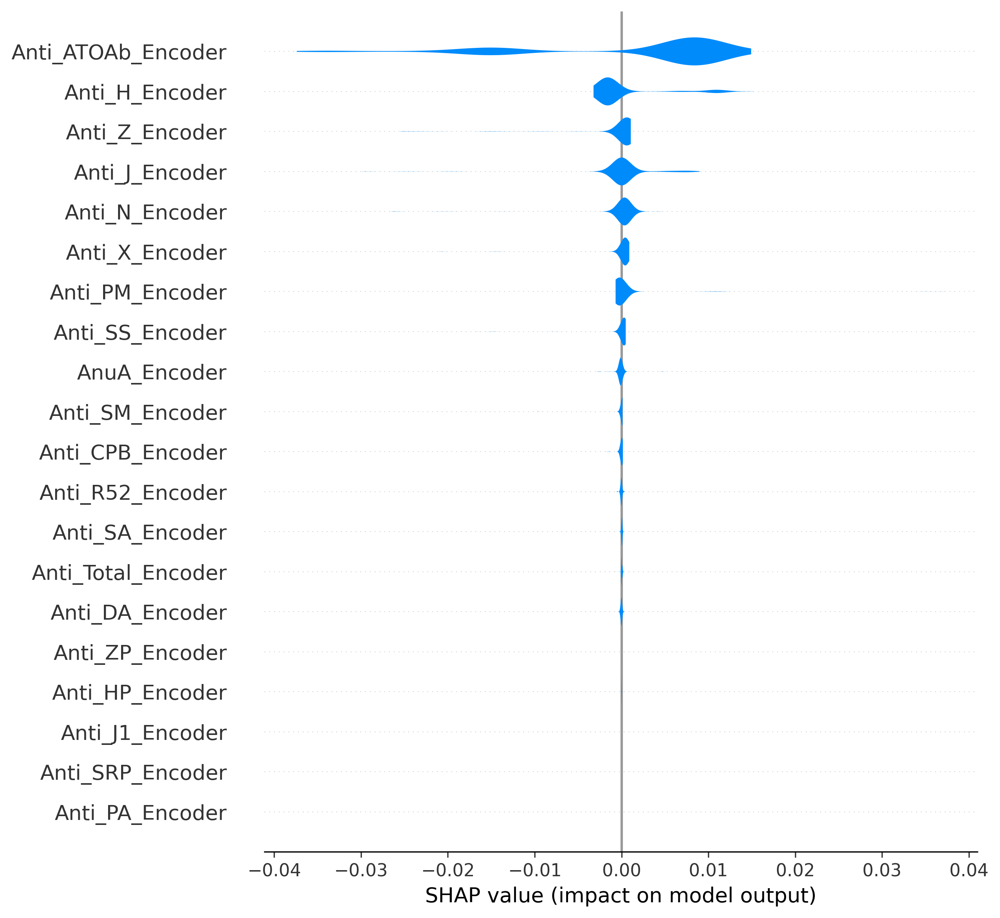

In [22]:
#绘制SHAP小提琴图
plt.figure(dpi=300)
shap.violin_plot(NK_Shap,NK_TestData.columns)
plt.show()

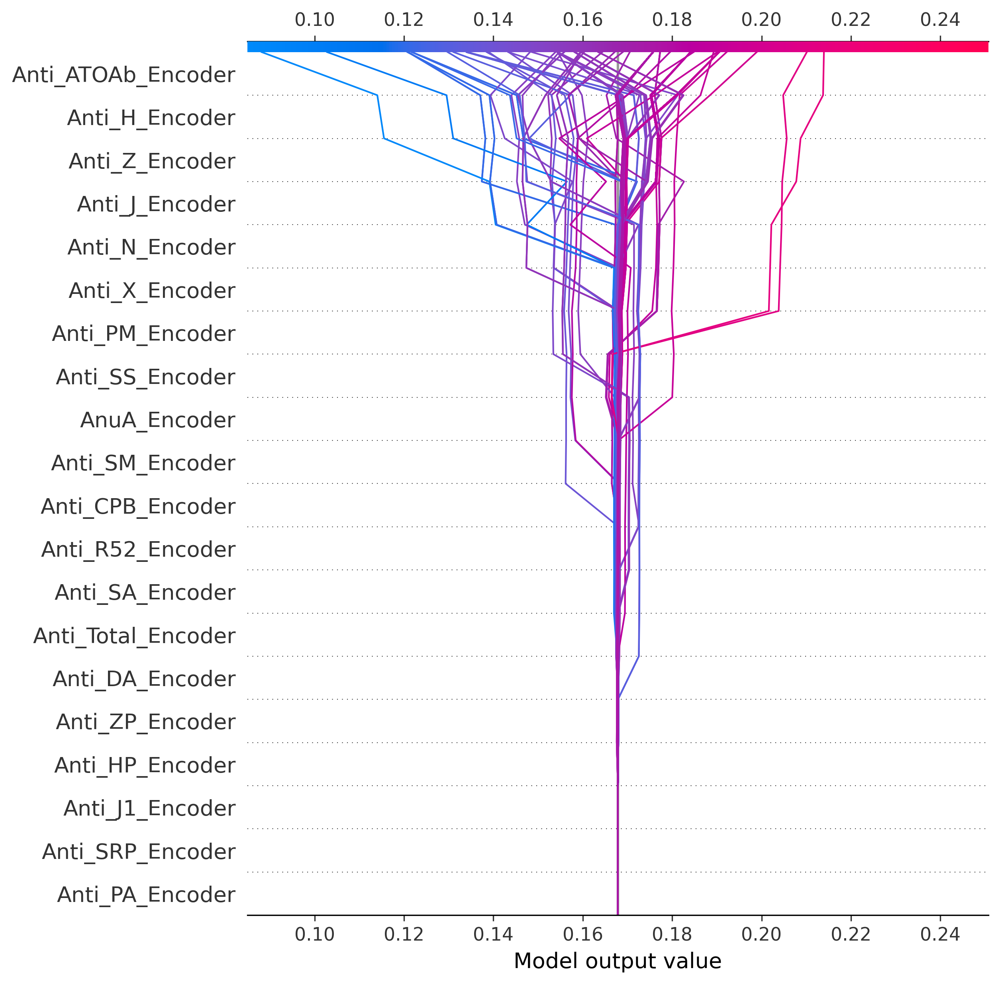

In [23]:
#绘制Decision_plot图
plt.figure(dpi=300)
shap.decision_plot(NK_expected_value,NK_Shap,NK_TestData.columns)
plt.show()

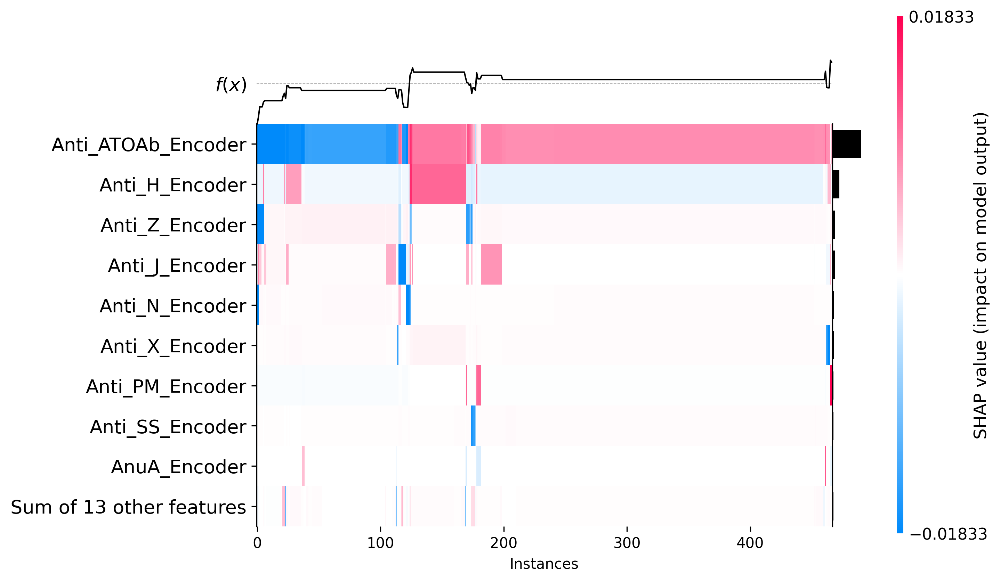

In [24]:
#绘制热力图
plt.figure(dpi=300)
shap.plots.heatmap(NK_XGBoost_Explainer(NK_TestData))
plt.show()

In [ ]:
#绘制indenpment_plot图
shap.initjs()    #初始化JS界面
shap.force_plot(NK_expected_value,NK_Shap,NK_TestData)

分析NK细胞与流产简单相关性

In [26]:
Lose_Data=Data.loc[:,'lose']    #获取流产数据
Lose_Data.value_counts()

lose
2     960
3     230
1     135
0     119
4      72
5      25
6       6
7       5
11      1
9       1
Name: count, dtype: int64

In [27]:
#调整lose数据
Lose_Data=Lose_Data.replace([1,2],1,inplace=False)
Lose_Data=Lose_Data.replace([3,4,5,6,7,9,11],2,inplace=False)
Lose_Data.value_counts()

lose
1    1095
2     340
0     119
Name: count, dtype: int64

In [28]:
#计算Kruskal-Wallis相关性
from scipy.stats import kruskal
Kruskal_Data=DataFrame(Lose_Data)
Kruskal_Data['NK%']=Data['NK%']
Group1=Kruskal_Data.loc[Kruskal_Data.loc[:,'lose']==0,'NK%']
Group2=Kruskal_Data.loc[Kruskal_Data.loc[:,'lose']==1,'NK%']
Group3=Kruskal_Data.loc[Kruskal_Data.loc[:,'lose']==2,'NK%']
Groups=[Group1,Group2,Group3]
kruskal_stats,kruskal_pvalue=kruskal(*Groups)
print('Kruskal检验统计量为:{0},P值为:{1}'.format(kruskal_stats,kruskal_pvalue))

Kruskal检验统计量为:16.88778927157506,P值为:0.00021521035005382284


/tmp/ipykernel_497/2818825390.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x='NK%',data=Kruskal_Data,hue='lose',shade=False)


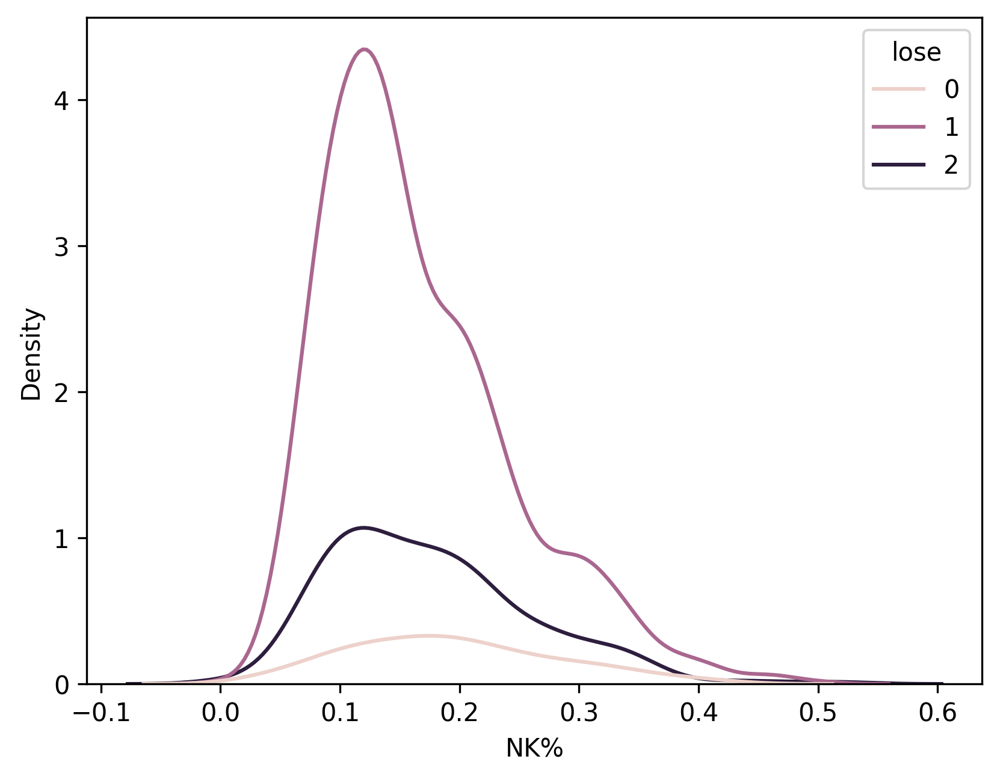

In [29]:
#绘制核密度估计图
plt.figure(dpi=300)
sns.kdeplot(x='NK%',data=Kruskal_Data,hue='lose',shade=False)
plt.show()

<Figure size 1920x1440 with 0 Axes>

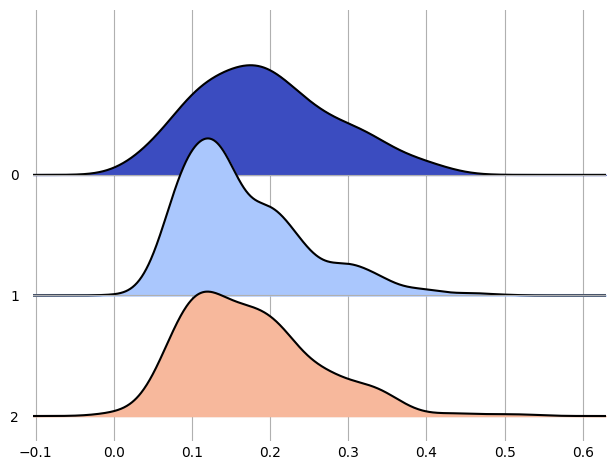

In [30]:
#绘制山脊图
from joypy import joyplot 
plt.figure(dpi=300)
joyplot(data=Kruskal_Data,by='lose', grid=True,colormap=sns.color_palette('coolwarm',as_cmap=True))
plt.show()

In [31]:
#载入Mann-Whitney U检验
#greater'：单向检验，检验第一组的中位数是否大于第二组
#如果p值小于你选择的显著性水平（通常设为0.05或0.01），则你拒绝原假设，认为第一组的中位数大于第二组的中位数
from scipy.stats import mannwhitneyu
#第1组和第2组比较
Man_WhitneyU_stats_1_2,Man_WhitneyU_Pvalue_1_2=mannwhitneyu(Group1,Group2,alternative='greater')
print('第一组与第二组Mann-WhitneyU检验统计量为:{0},P值为:{1}'.format(Man_WhitneyU_stats_1_2,Man_WhitneyU_Pvalue_1_2))
#第1组和第3组比较
Man_WhitneyU_stats_1_3,Man_WhitneyU_Pvalue_1_3=mannwhitneyu(Group1,Group3,alternative='greater')
print('第一组与第三组Mann-WhitneyU检验统计量为:{0},P值为:{1}'.format(Man_WhitneyU_stats_1_3,Man_WhitneyU_Pvalue_1_3))
#第2组和第3组比较
Man_WhitneyU_stats_2_3,Man_WhitneyU_Pvalue_2_3=mannwhitneyu(Group2,Group3,alternative='less')
print('第二组与第三组Mann-WhitneyU检验统计量为:{0},P值为:{1}'.format(Man_WhitneyU_stats_2_3,Man_WhitneyU_Pvalue_2_3))

第一组与第二组Mann-WhitneyU检验统计量为:78969.0,P值为:7.127957316821349e-05
第一组与第三组Mann-WhitneyU检验统计量为:22970.5,P值为:0.013898545226142816
第二组与第三组Mann-WhitneyU检验统计量为:172000.5,P值为:0.017011868212132075


0>2>1
NK细胞数目降低利于流产

In [32]:
#数据切分
import numpy as np
Log_TrainData,Log_TestData,Log_TrainTarget,Log_TestTarget=train_test_split(Kruskal_Data.loc[:,'NK%'],Kruskal_Data.loc[:,'lose'])
Log_TrainData=np.array(Log_TrainData).reshape(Log_TrainData.shape[0],1)
Log_TestData=np.array(Log_TestData).reshape(Log_TestData.shape[0],1)
print('训练数据集形状:{0},测试数据集为:{1}'.format(Log_TrainData.shape,Log_TestData.shape))
print('训练数据集标签形状:{0},测试数据集标签为:{1}'.format(Log_TrainTarget.shape,Log_TestTarget.shape))

训练数据集形状:(1165, 1),测试数据集为:(389, 1)
训练数据集标签形状:(1165,),测试数据集标签为:(389,)


In [33]:
#Logistic载入机器学习模型
from sklearn.linear_model import LogisticRegression
Model_Logistic=LogisticRegression(solver='lbfgs', multi_class='auto')
Model_Logistic.fit(Log_TrainData,Log_TrainTarget)

LogisticRegression()

In [34]:
#打印差数
print('Logistic回归模型系数为:',Model_Logistic.coef_)
print('Logistic回归模型截距为:',Model_Logistic.intercept_)

Logistic回归模型系数为: [[ 0.98509396]
 [-0.83427021]
 [-0.15082375]]
Logistic回归模型截距为: [-1.24202689  1.25678599 -0.0147591 ]


In [35]:
#使用聚类算法计算正常、流产和习惯性流产
from sklearn.cluster import KMeans
Cluster_Three=KMeans(n_clusters=3)
Cluster_Three_X=Kruskal_Data.loc[:,'NK%'].values.reshape(-1,1)
Cluster_Three.fit(Cluster_Three_X,Cluster_Three_X)

/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=3)

In [129]:
joblib.dump(Cluster_Three,'/mnt/workspace/ML_Model/ML_Models_lose/Cluster_Three.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/Cluster_Three.pkl']

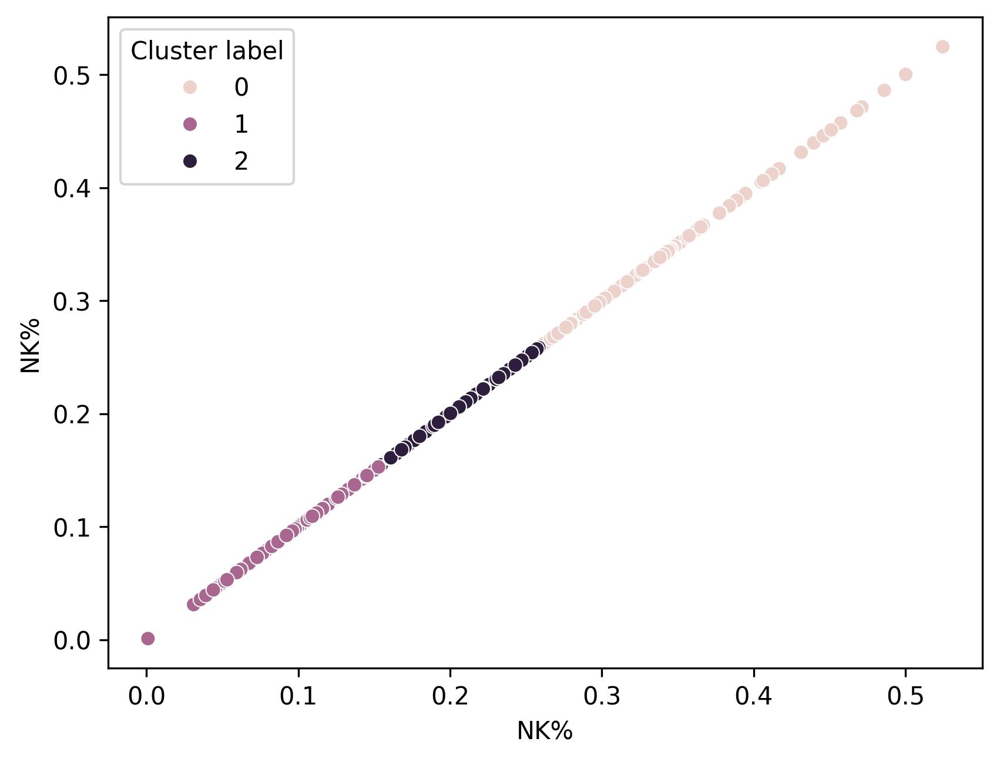

In [36]:
#整个数据
Kruskal_Data['Cluster label']=Cluster_Three.labels_
plt.figure(dpi=300)
sns.scatterplot(x='NK%',y='NK%',hue='Cluster label',data=Kruskal_Data)
plt.show()

In [37]:
#获取截断数据
#截断点：0.1535-0.1537,0.2602-0.2617
print(Kruskal_Data.loc[Kruskal_Data['Cluster label']==0,:].describe())
print(Kruskal_Data.loc[Kruskal_Data['Cluster label']==2,:].describe())
print(Kruskal_Data.loc[Kruskal_Data['Cluster label']==1,:].describe())

             lose         NK%  Cluster label
count  222.000000  222.000000          222.0
mean     1.139640    0.321783            0.0
std      0.589006    0.049020            0.0
min      0.000000    0.261700            0.0
25%      1.000000    0.286800            0.0
50%      1.000000    0.309050            0.0
75%      1.750000    0.342375            0.0
max      2.000000    0.524600            0.0
             lose         NK%  Cluster label
count  535.000000  535.000000          535.0
mean     1.138318    0.199821            2.0
std      0.563836    0.028408            0.0
min      0.000000    0.153500            2.0
25%      1.000000    0.175150            2.0
50%      1.000000    0.199700            2.0
75%      1.000000    0.220650            2.0
max      2.000000    0.260200            2.0
             lose         NK%  Cluster label
count  797.000000  797.000000          797.0
mean     1.145546    0.107535            1.0
std      0.477005    0.028499            0.0
min      0

In [38]:
#计算不同NK细胞水平与抗体的相关性——统计学分析
for Anti in Data.iloc[:,35:].columns:
    Kruskal_Data[Anti]=Data.loc[:,Anti]
Kruskal_Data.head(10)

,lose,NK%,Cluster label,Anti_J_Encoder,Anti_Z_Encoder,Anti_N_Encoder,Anti_ATOAb_Encoder,Anti_Total_Encoder,Anti_H_Encoder,Anti_A1_Encoder,...,Anti_PA_Encoder,Anti_CPB_Encoder,Anti_SRP_Encoder,Anti_R52_Encoder,Anti_SS_Encoder,Anti_J1_Encoder,Anti_DA_Encoder,Anti_SM_Encoder,Anti_PM_Encoder,AnuA_Encoder
0,1,0.0756,1,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0
1,1,0.1486,1,0.0,0.0,1.0,1.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0
2,1,0.3885,0,1.0,0.0,0.0,1.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0
3,1,0.2069,2,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0
4,2,0.3153,0,0.0,0.0,0.0,0.0,1.0,0.0,0,...,0,0,0,0.0,0,1,0,0,0,0
5,1,0.2071,2,0.0,0.0,0.0,0.0,1.0,0.0,0,...,1,0,0,0.0,0,0,0,0,0,0
6,1,0.2337,2,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0
7,1,0.2256,2,0.0,0.0,0.0,0.0,1.0,0.0,0,...,0,0,0,0.0,1,0,0,0,0,0
8,1,0.1062,1,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0
9,1,0.3116,0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0,0,0,0.0,0,0,0,0,0,0


In [39]:
#执行卡方检验
from scipy.stats import chi2_contingency
X2_LoseResult=DataFrame()
X2_Loselabel,X2_LoseChi2,X2_LosePvalue,X2_LoseDof=[],[],[],[]
for Anti in Kruskal_Data.iloc[:,3:].columns:
    crosstab_result=pd.crosstab(Kruskal_Data.loc[:,'Cluster label'],Kruskal_Data.loc[:,Anti])
    observed=crosstab_result.values
    x2_losechi2,x2_losepvalue,dof,expected=chi2_contingency(observed)
    X2_Loselabel.append(Anti)
    X2_LoseChi2.append(x2_losechi2)
    X2_LosePvalue.append(x2_losepvalue)
    X2_LoseDof.append(dof)
X2_LoseResult['Anti']=X2_Loselabel
X2_LoseResult['Chi2']=X2_LoseChi2
X2_LoseResult['P value']=X2_LosePvalue
X2_LoseResult['Dof']=dof
X2_LoseResult

,Anti,Chi2,P value,Dof
0,Anti_J_Encoder,1.377150,5.022913e-01,2
1,Anti_Z_Encoder,7.983477,1.846758e-02,2
2,Anti_N_Encoder,14.222563,8.158487e-04,2
3,Anti_ATOAb_Encoder,52.045579,4.993972e-12,2
4,Anti_Total_Encoder,1.891606,3.883676e-01,2
5,Anti_H_Encoder,9.047750,1.084691e-02,2
6,Anti_A1_Encoder,0.950423,6.217534e-01,2
7,Anti_S7_Encoder,0.636254,7.275103e-01,2
8,Anti_SA_Encoder,1.827068,4.011043e-01,2
9,Anti_X_Encoder,1.544772,4.619096e-01,2


In [130]:
#输出卡方检验结果
X2_LoseResult.to_excel('/mnt/workspace/Analysis_Result/X2_LoseResult.xlsx','UTF-8')

卡方检验结果表明，Anti_N_Encoder、Anti_Z_Encoder、Anti_ATOAb_Encoder、Anti_H_Encoder、Anti_DA_Encoder与NK细胞分布不是独立的，具有一定相关性。

载入机器学习模型-CatBoost模型

In [41]:
#划分数据集
from sklearn.model_selection import train_test_split
ClusterThree_Label=Kruskal_Data.loc[:,'Cluster label']    #获取NK细胞自动数据
ClusterThree_Anti=Kruskal_Data.iloc[:,3:]     #获取抗体数据
ClusterThree_TrainData,ClusterThree_TestData,ClusterThree_TrainTarget,ClusterThree_TestTarget=train_test_split(
    ClusterThree_Anti,ClusterThree_Label,train_size=0.7,random_state=2024)
print('训练数据集形状:{0},测试数据集为:{1}'.format(ClusterThree_TrainData.shape,ClusterThree_TestData.shape))
print('训练数据集标签形状:{0},测试数据集标签为:{1}'.format(ClusterThree_TrainTarget.shape,ClusterThree_TestTarget.shape))

训练数据集形状:(1087, 22),测试数据集为:(467, 22)
训练数据集标签形状:(1087,),测试数据集标签为:(467,)


In [42]:
ClusterThree_XGBoost=xgboost.XGBClassifier(booster='gbtree',objective='multi:softmax',n_estimators=9,
                                  min_child_weight=0.1,max_depth=3,tree_method='gpu_hist',n_jobs=-1,
                                 random_state=2024)
ClusterThree_XGBoost.fit(ClusterThree_TrainData,ClusterThree_TrainTarget)

/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:01:24] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=0.1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=9, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softmax', ...)

In [132]:
joblib.dump(ClusterThree_XGBoost,'/mnt/workspace/ML_Model/ML_Models_lose/ClusterThree_XGBoost.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/ClusterThree_XGBoost.pkl']

In [43]:
#设置分类评估函数
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score,classification_report
def model_error_class(X_train,X_test,y_train,y_test,model):
    Predict_TrainData=model.predict(X_train)    #获取预测数据
    Train_precision=precision_score(y_train,Predict_TrainData,average='macro')    #计算训练Precision_score
    Train_recall=recall_score(y_train,Predict_TrainData,average='macro')    #计算训练Recall_score
    Train_f1_score=f1_score(y_train,Predict_TrainData,average='macro')    #计算训练F1_score
    Train_accuracy=accuracy_score(y_train,Predict_TrainData)    #计算训练accuracy_score
    print('训练Precision为:{0},Recall为:{1},F1分数为:{2},Accuracy为:{3}'.format(Train_precision,Train_recall,
                                                                        Train_f1_score,Train_accuracy))
    Predict_TestData=model.predict(X_test)    #获取预测数据
    Test_precision=precision_score(y_test,Predict_TestData,average='macro')    #计算测试Precision_score
    Test_recall=recall_score(y_test,Predict_TestData,average='macro')    #计算测试Recall_score
    Test_f1_score=f1_score(y_test,Predict_TestData,average='macro')    #计算测试F1_score
    Test_accuracy=accuracy_score(y_test,Predict_TestData)    #计算测试accuracy_score
    print('训练Precision为:{0},Recall为:{1},F1分数为:{2},Accuracy为:{3}'.format(Test_precision,Test_recall,
                                                                        Test_f1_score,Test_accuracy))
    print('--------------------训练集分类报告--------------------')
    print(classification_report(y_train,Predict_TrainData))
    print('--------------------测试集分类报告--------------------')
    print(classification_report(y_test,Predict_TestData))

In [44]:
model_error_class(ClusterThree_TrainData,ClusterThree_TestData,ClusterThree_TrainTarget,
                  ClusterThree_TestTarget,ClusterThree_XGBoost)

训练Precision为:0.5691258835002372,Recall为:0.367633398605419,F1分数为:0.31700242136774476,Accuracy为:0.5400183992640294
训练Precision为:0.3003525971792225,Recall为:0.33803392601675863,F1分数为:0.2814648365751144,Accuracy为:0.48394004282655245
--------------------训练集分类报告--------------------
              precision    recall  f1-score   support

           0       0.67      0.01      0.03       149
           1       0.54      0.93      0.69       564
           2       0.50      0.16      0.24       374

    accuracy                           0.54      1087
   macro avg       0.57      0.37      0.32      1087
weighted avg       0.54      0.54      0.44      1087

--------------------测试集分类报告--------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        73
           1       0.50      0.87      0.63       233
           2       0.40      0.14      0.21       161

    accuracy                           0.48       467
   macro avg       0.30

/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:01:31] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

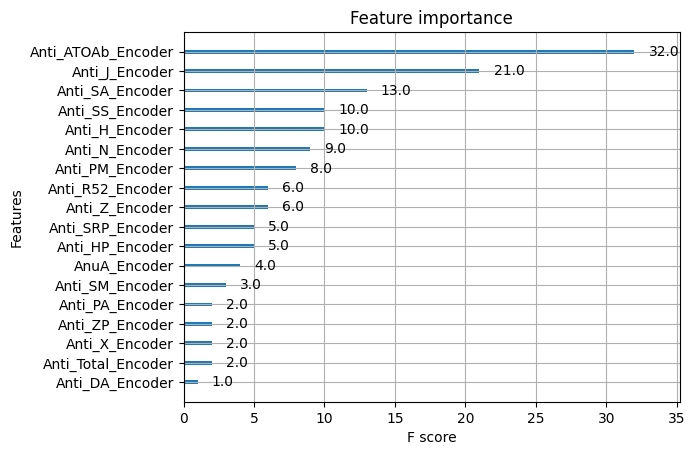

In [45]:
#输出XGBoost模型特征重要性
xgboost.plot_importance(ClusterThree_XGBoost)

<Figure size 1920x1440 with 0 Axes>

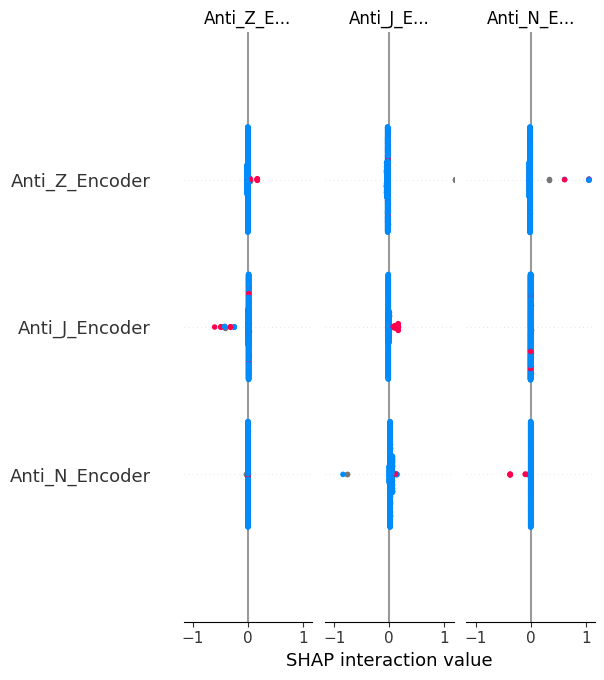

In [46]:
#载入SHAP计算
Explainer_ThreeLose=shap.TreeExplainer(ClusterThree_XGBoost)
Shap_ThreeLose=Explainer_ThreeLose.shap_values(ClusterThree_TestData)
plt.figure(dpi=300)
shap.summary_plot(Shap_ThreeLose,ClusterThree_TestData,plot_type='bar')
plt.show()

较比是否流产与NK细胞的相关性

In [47]:
#获取二分类数据集
Loss_Two=Data.loc[:,'lose']
Loss_Two=Loss_Two.replace([1,2,3,4,5,6,7,9,11],1,inplace=False)
Loss_Two.value_counts()    #0表示正常，1代表流产

lose
1    1435
0     119
Name: count, dtype: int64

In [48]:
#进行MannWhitney U检验
 #检验结果表明：流产患者NK细胞比例偏低
MannWhitney_Data_Two=DataFrame(Loss_Two)
MannWhitney_Data_Two['NK%']=Data.loc[:,'NK%']
Group_Two0=MannWhitney_Data_Two.loc[MannWhitney_Data_Two['lose']==0,'NK%']
Group_Two1=MannWhitney_Data_Two.loc[MannWhitney_Data_Two['lose']==1,'NK%']
mannwhitneyu_two_stats,mannwhitneyu_two_pvalue=mannwhitneyu(Group_Two0,Group_Two1,alternative='greater')
print('正常患者和流产患者双因素Kruskal检验统计量为:{0},P值为:{1}'.format(mannwhitneyu_two_stats,mannwhitneyu_two_pvalue))

正常患者和流产患者双因素Kruskal检验统计量为:101939.5,P值为:0.00021608923431994063


/tmp/ipykernel_497/2952356310.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x='NK%',hue='lose',shade=True,data=MannWhitney_Data_Two)


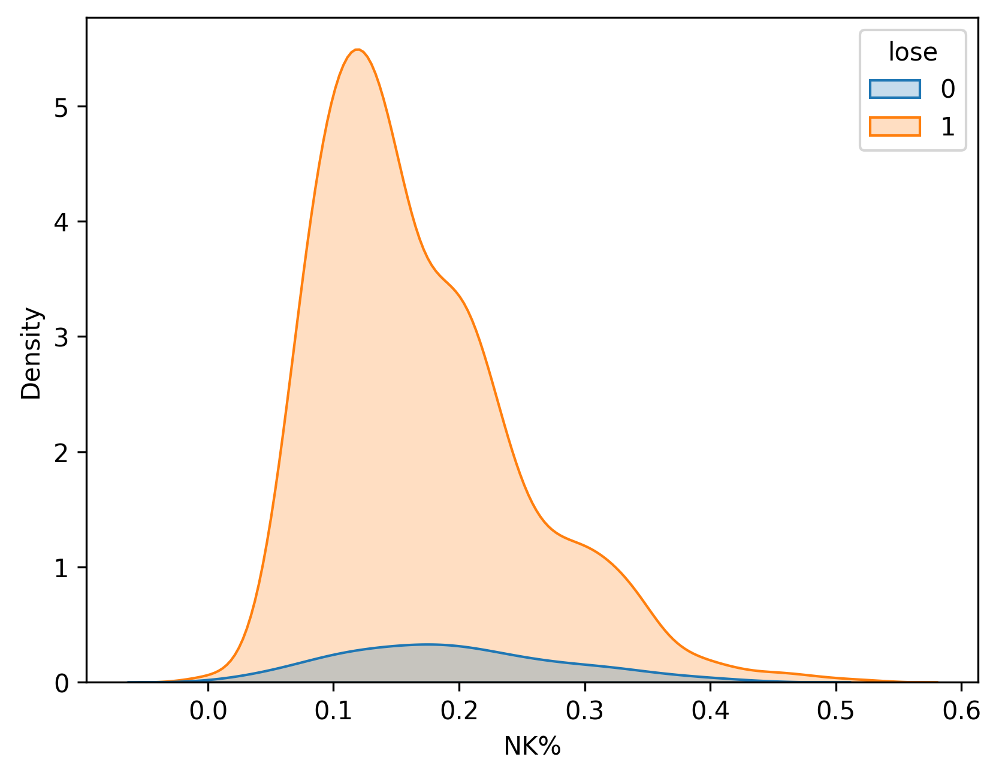

In [49]:
#绘制累计分布图和核密度估计图
plt.figure(dpi=300)
sns.kdeplot(x='NK%',hue='lose',shade=True,data=MannWhitney_Data_Two)
plt.show()

In [50]:
#使用聚类算法完成NK细胞划分
from sklearn.cluster import KMeans
Two_cluster=KMeans(n_clusters=2)    #流产是否与NK细胞高低比例相关
Two_cluster_X=MannWhitney_Data_Two['NK%'].values.reshape(-1, 1)
Two_cluster.fit(Two_cluster_X,Two_cluster_X)

/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2)

In [133]:
joblib.dump(Two_cluster,'/mnt/workspace/ML_Model/ML_Models_lose/Two_cluster.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/Two_cluster.pkl']

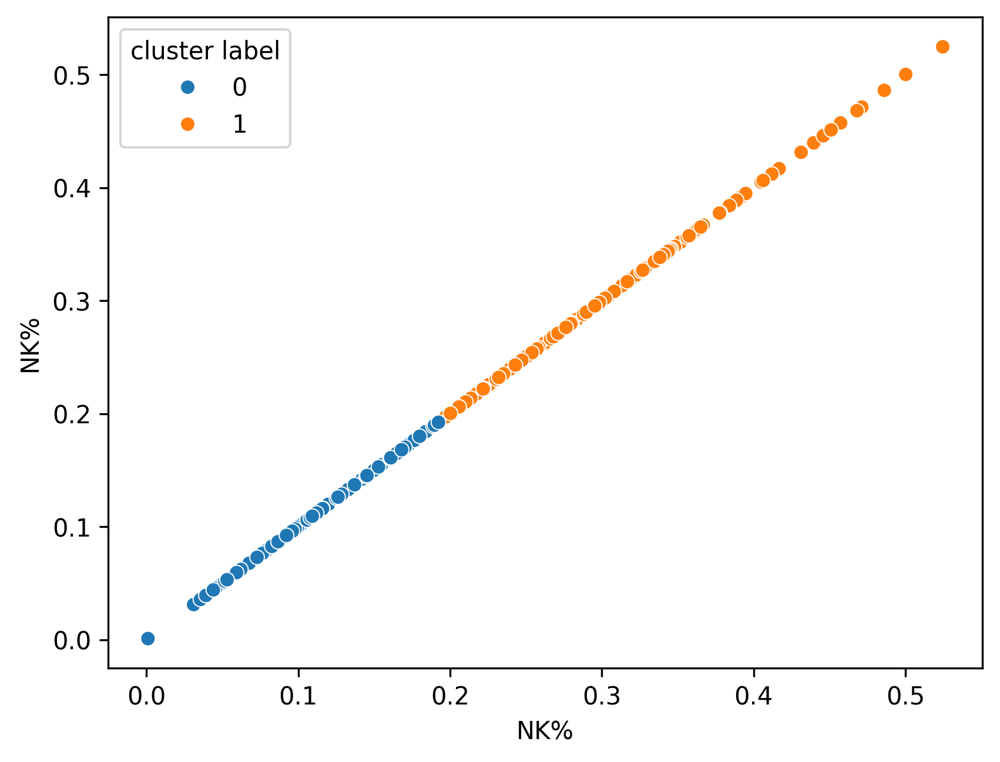

In [51]:
#获取数据标签
MannWhitney_Data_Two['cluster label']=Two_cluster.labels_
plt.figure(dpi=300)
sns.scatterplot(x='NK%',y='NK%',data=MannWhitney_Data_Two,hue='cluster label')
plt.show()

In [52]:
#获取数据划分
#截断点：0.1927-0.1934
print(MannWhitney_Data_Two.loc[MannWhitney_Data_Two['cluster label']==1,:].describe())
print(MannWhitney_Data_Two.loc[MannWhitney_Data_Two['cluster label']==0,:].describe())

             lose         NK%  cluster label
count  521.000000  521.000000          521.0
mean     0.892514    0.263863            1.0
std      0.310027    0.060885            0.0
min      0.000000    0.193400            1.0
25%      1.000000    0.213800            1.0
50%      1.000000    0.246500            1.0
75%      1.000000    0.302400            1.0
max      1.000000    0.524600            1.0
              lose          NK%  cluster label
count  1033.000000  1033.000000         1033.0
mean      0.939013     0.122530            0.0
std       0.239423     0.037650            0.0
min       0.000000     0.001013            0.0
25%       1.000000     0.094300            0.0
50%       1.000000     0.122300            0.0
75%       1.000000     0.150000            0.0
max       1.000000     0.192700            0.0


In [53]:
for Anti in Data.iloc[:,35:].columns:
    MannWhitney_Data_Two[Anti]=Data.loc[:,Anti]

In [54]:
X2_LoseResult_Two=DataFrame()
X2_Loselabel_Two,X2_LoseChi2_Two,X2_LosePvalue_Two,X2_LoseDof_Two=[],[],[],[]
for Anti_Two in MannWhitney_Data_Two.iloc[:,3:].columns:
    crosstab_result_Two=pd.crosstab(MannWhitney_Data_Two.loc[:,'cluster label'],MannWhitney_Data_Two.loc[:,Anti])
    observed_Two=crosstab_result_Two.values
    x2_losechi2_Two,x2_losepvalue_Two,dof_Two,expected_Two=chi2_contingency(observed_Two)
    X2_Loselabel_Two.append(Anti_Two)
    X2_LoseChi2_Two.append(x2_losechi2_Two)
    X2_LosePvalue_Two.append(x2_losepvalue_Two)
    X2_LoseDof_Two.append(dof_Two)
X2_LoseResult_Two['Anti']=X2_Loselabel_Two
X2_LoseResult_Two['Chi2']=X2_LoseChi2_Two
X2_LoseResult_Two['P value']=X2_LosePvalue_Two
X2_LoseResult_Two['Dof']=dof_Two
X2_LoseResult_Two

,Anti,Chi2,P value,Dof
0,Anti_J_Encoder,2.311762,0.128398,1
1,Anti_Z_Encoder,2.311762,0.128398,1
2,Anti_N_Encoder,2.311762,0.128398,1
3,Anti_ATOAb_Encoder,2.311762,0.128398,1
4,Anti_Total_Encoder,2.311762,0.128398,1
5,Anti_H_Encoder,2.311762,0.128398,1
6,Anti_A1_Encoder,2.311762,0.128398,1
7,Anti_S7_Encoder,2.311762,0.128398,1
8,Anti_SA_Encoder,2.311762,0.128398,1
9,Anti_X_Encoder,2.311762,0.128398,1


载入机器学习模型-XGBoost模型

In [55]:
ClusterTwo_Label=MannWhitney_Data_Two.loc[:,'cluster label']    #获取NK细胞自动数据
ClusterTwo_Anti=MannWhitney_Data_Two.iloc[:,3:]     #获取抗体数据
ClusterTwo_TrainData,ClusterTwo_TestData,ClusterTwo_TrainTarget,ClusterTwo_TestTarget=train_test_split(
    ClusterTwo_Anti,ClusterTwo_Label,train_size=0.7,random_state=2024)
print('训练数据集形状:{0},测试数据集为:{1}'.format(ClusterTwo_TrainData.shape,ClusterTwo_TestData.shape))
print('训练数据集标签形状:{0},测试数据集标签为:{1}'.format(ClusterTwo_TrainTarget.shape,ClusterTwo_TestTarget.shape))

训练数据集形状:(1087, 22),测试数据集为:(467, 22)
训练数据集标签形状:(1087,),测试数据集标签为:(467,)


In [56]:
ClusterTwo_XGBoost=xgboost.XGBClassifier(booster='gbtree',objective='binary:logistic',n_estimators=9,
                                  min_child_weight=0.1,max_depth=3,tree_method='gpu_hist',n_jobs=-1,
                                 random_state=2024)
ClusterTwo_XGBoost.fit(ClusterTwo_TrainData,ClusterTwo_TrainTarget)

/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:02:31] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=0.1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=9, n_jobs=-1,
              num_parallel_tree=None, random_state=2024, ...)

In [134]:
joblib.dump(ClusterTwo_XGBoost,'/mnt/workspace/ML_Model/ML_Models_lose/ClusterTwo_XGBoost.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/ClusterTwo_XGBoost.pkl']

In [57]:
model_error_class(ClusterTwo_TrainData,ClusterTwo_TestData,ClusterTwo_TrainTarget,ClusterTwo_TestTarget,
                    ClusterTwo_XGBoost)

训练Precision为:0.6227513227513227,Recall为:0.5035659939439585,F1分数为:0.41300713576201753,Accuracy为:0.6734130634774609
训练Precision为:0.8240343347639485,Recall为:0.503030303030303,F1分数为:0.3992532630522089,Accuracy为:0.6488222698072805
--------------------训练集分类报告--------------------
              precision    recall  f1-score   support

           0       0.67      1.00      0.80       731
           1       0.57      0.01      0.02       356

    accuracy                           0.67      1087
   macro avg       0.62      0.50      0.41      1087
weighted avg       0.64      0.67      0.55      1087

--------------------测试集分类报告--------------------
              precision    recall  f1-score   support

           0       0.65      1.00      0.79       302
           1       1.00      0.01      0.01       165

    accuracy                           0.65       467
   macro avg       0.82      0.50      0.40       467
weighted avg       0.77      0.65      0.51       467



/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:02:39] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

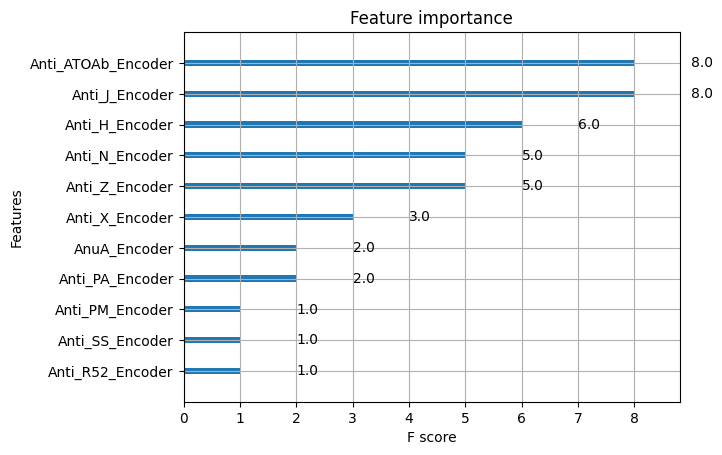

In [58]:
#输出特征重要性
xgboost.plot_importance(ClusterTwo_XGBoost)

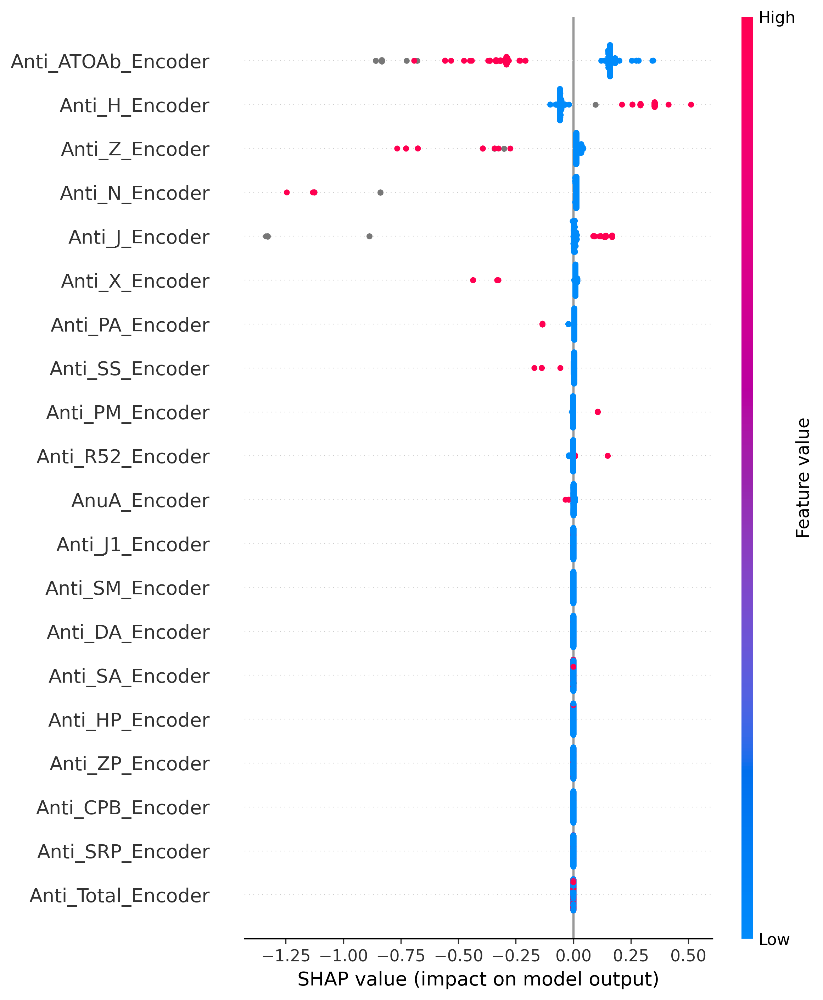

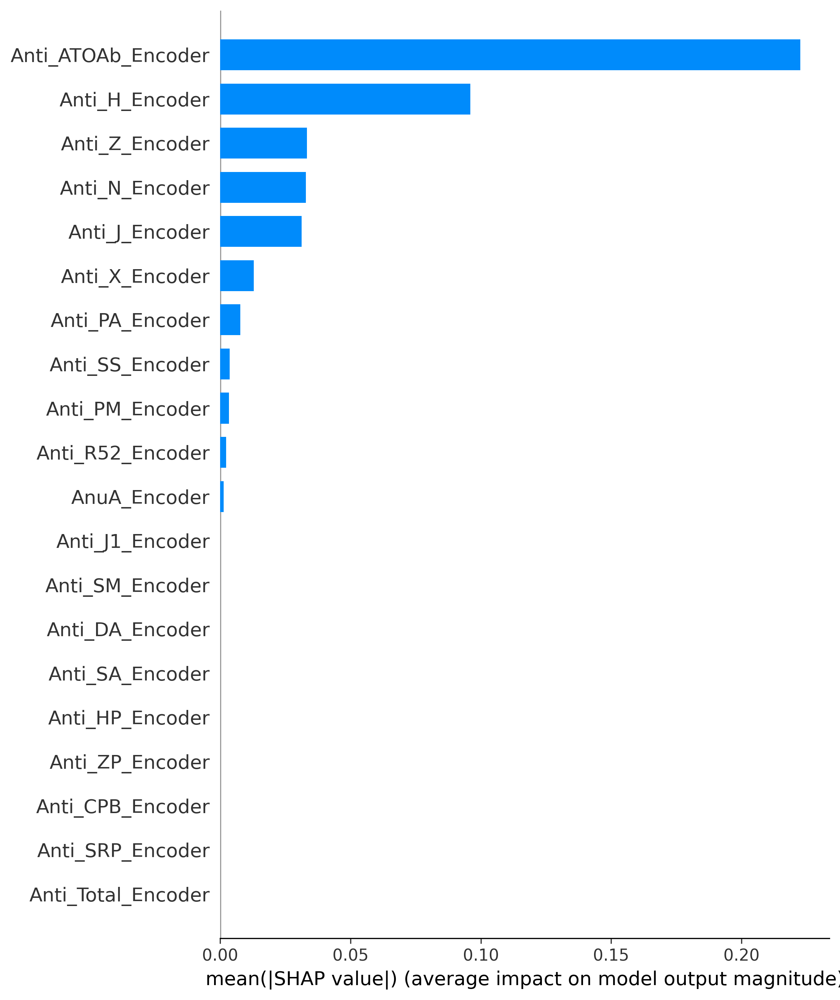

In [59]:
#载入SHAP计算
Explainer_TwoLose=shap.TreeExplainer(ClusterTwo_XGBoost)
Shap_TwoLose=Explainer_TwoLose.shap_values(ClusterTwo_TestData)
plt.figure(dpi=300)
shap.summary_plot(Shap_TwoLose,ClusterTwo_TestData)
plt.show()
plt.figure(dpi=300)
shap.summary_plot(Shap_TwoLose,ClusterTwo_TestData,plot_type='bar')
plt.show()

分析流产与NK%、抗体间的相关性

In [60]:
#重构Lose分析数据集
Lose_Analysis_label=list(Data.iloc[:,:13].columns)+list(Data.iloc[:,35:].columns)
Lose_Analysis=Data.loc[:,Lose_Analysis_label]
Lose_Analysis

,age,lose,CD4/8,CD3+_value,CD3+CD8+value,CD3+CD4+_value,NK_value,B_value,CD3+%,CD3+CD8+%,...,Anti_PA_Encoder,Anti_CPB_Encoder,Anti_SRP_Encoder,Anti_R52_Encoder,Anti_SS_Encoder,Anti_J1_Encoder,Anti_DA_Encoder,Anti_SM_Encoder,Anti_PM_Encoder,AnuA_Encoder
0,32,2,0.96,2828.0,1340.0,1284.0,238.0,78.0,0.8992,0.4261,...,0,0,0,0.0,0,0,0,0,0,0
1,31,2,1.19,1617.0,667.0,794.0,60.0,293.0,0.8195,0.3379,...,0,0,0,0.0,0,0,0,0,0,0
2,33,2,1.34,986.0,394.0,528.0,667.0,64.0,0.5741,0.2296,...,0,0,0,0.0,0,0,0,0,0,0
3,28,2,1.26,930.0,361.0,456.0,255.0,47.0,0.7544,0.2926,...,0,0,0,0.0,0,0,0,0,0,0
4,39,3,1.34,1265.0,514.0,689.0,617.0,75.0,0.6462,0.2623,...,0,0,0,0.0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1549,35,1,2.15,1948.0,579.0,1243.0,235.0,358.0,0.7656,0.2276,...,0,0,0,0.0,0,0,0,0,0,1
1550,30,1,2.48,2309.0,546.0,1356.0,463.0,405.0,0.7148,0.1690,...,0,0,0,0.0,0,0,0,0,0,0
1551,27,1,1.37,2007.0,759.0,1041.0,982.0,332.0,0.6035,0.2284,...,0,0,0,0.0,0,0,0,0,0,0
1552,31,1,1.71,1013.0,326.0,556.0,146.0,179.0,0.7558,0.2431,...,0,0,0,0.0,0,0,0,0,1,0


In [61]:
#计算相关性
Spearman_lose=Lose_Analysis.iloc[:,:13].corr('spearman')
Spearman_lose['lose'].sort_values(ascending=False)

lose              1.000000
age               0.019333
NK_value          0.013266
B%                0.006370
NK%               0.001302
CD3+CD8+%        -0.000375
CD4/8            -0.008691
CD3+%            -0.016991
CD3+CD8+value    -0.017486
CD3+CD4+%        -0.017787
B_value          -0.024180
CD3+_value       -0.028059
CD3+CD4+_value   -0.029051
Name: lose, dtype: float64

<Figure size 1920x1440 with 0 Axes>

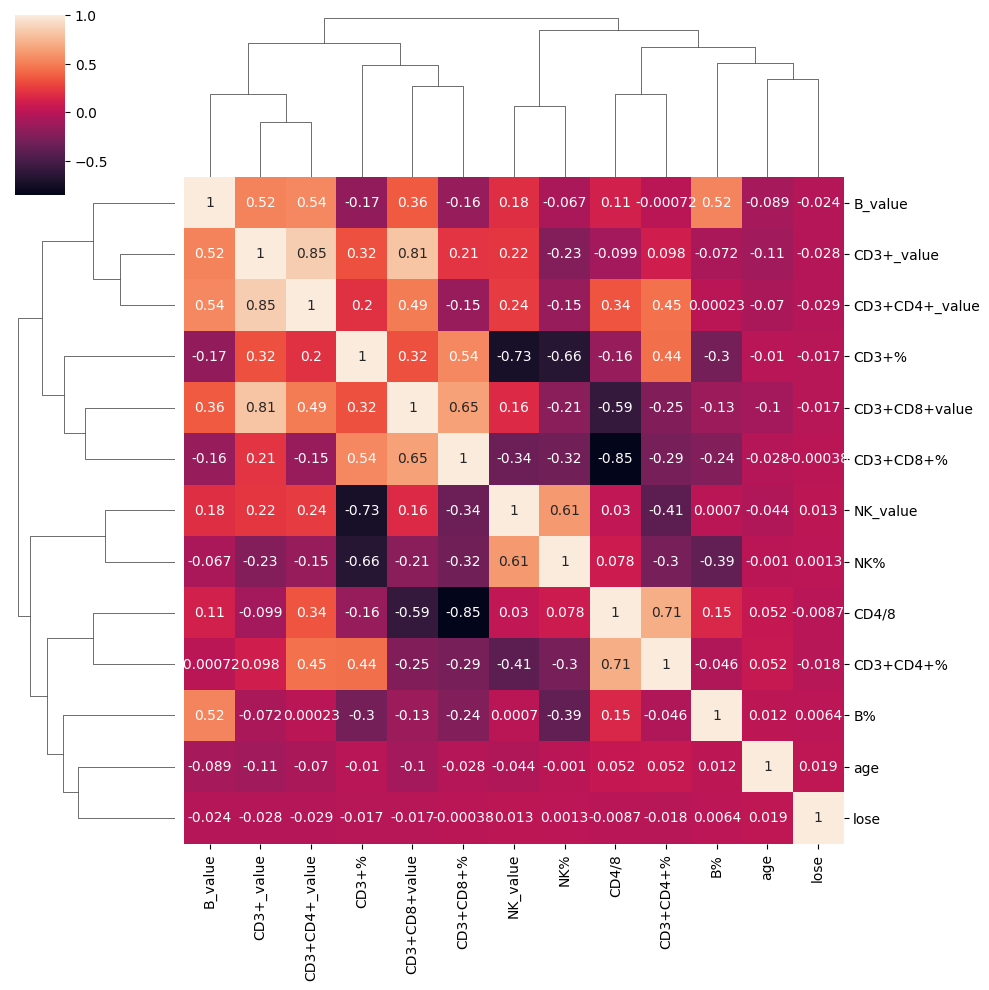

In [62]:
#绘制热力图
plt.figure(dpi=300)
sns.clustermap(Spearman_lose,annot=True)
plt.show()

计算抗体与lose的相关性

In [63]:
#获取抗体数据
Lose_Analysis_Anti=Lose_Analysis.iloc[:,13:]    #获取lose分析抗体数据
Lose_Analysis_lose=Lose_Analysis.loc[:,'lose']    #获取抗体数据
Lose_Analysis_TrainData,Lose_Analysis_TestData,Lose_Analysis_TrainLose,Lose_Analysis_TestLose=train_test_split(Lose_Analysis_Anti,
                                                                                                              Lose_Analysis_lose,train_size=0.7,random_state=2024)
print('流产次数分析训练数据集规模为:{0},测试数据集规模为:{1}'.format(Lose_Analysis_TrainData.shape,Lose_Analysis_TestData.shape))
print('流产次数分析训练数据集标签规模为:{0},测试数据集标签规模为:{1}'.format(Lose_Analysis_TrainLose.shape,Lose_Analysis_TestLose.shape))

流产次数分析训练数据集规模为:(1087, 22),测试数据集规模为:(467, 22)
流产次数分析训练数据集标签规模为:(1087,),测试数据集标签规模为:(467,)


In [64]:
#载入并训练XGBoost模型
XGBoost_Lose=xgboost.XGBRegressor(booster='gbtree',objective='reg:squarederror',n_estimators=9,
                                  min_child_weight=0.1,max_depth=3,tree_method='gpu_hist',n_jobs=-1,
                                 random_state=2024)
XGBoost_Lose.fit(Lose_Analysis_TrainData,Lose_Analysis_TrainLose)

/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:04:03] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=0.1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=9, n_jobs=-1,
             num_parallel_tree=None, random_state=2024, ...)

In [135]:
joblib.dump(XGBoost_Lose,'/mnt/workspace/ML_Model/ML_Models_lose/XGBoost_Lose.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/XGBoost_Lose.pkl']

In [65]:
#评估模型结果
Model_Error(Lose_Analysis_TrainData,Lose_Analysis_TestData,Lose_Analysis_TrainLose,Lose_Analysis_TestLose,XGBoost_Lose)

模型训练MSE为:1.076416169036762,模型测试MSE为:1.0346601285410237
模型训练MAE为:0.6173148044447561,模型测试MAE为:0.624464778624459


/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:04:06] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


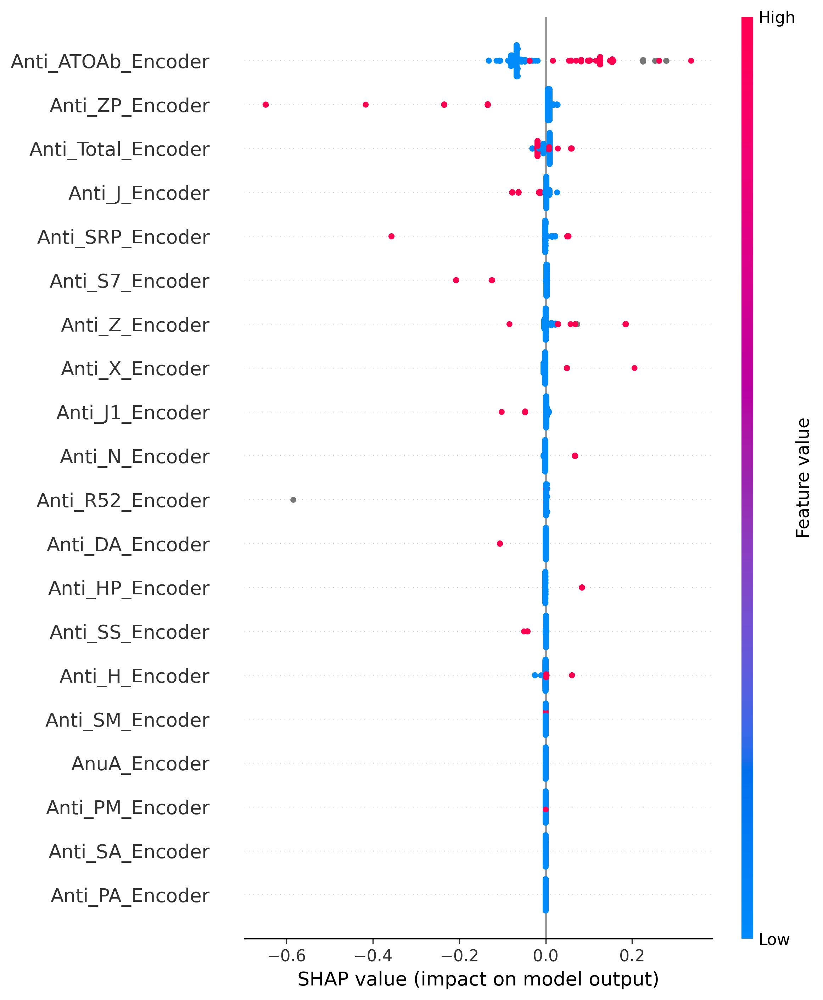

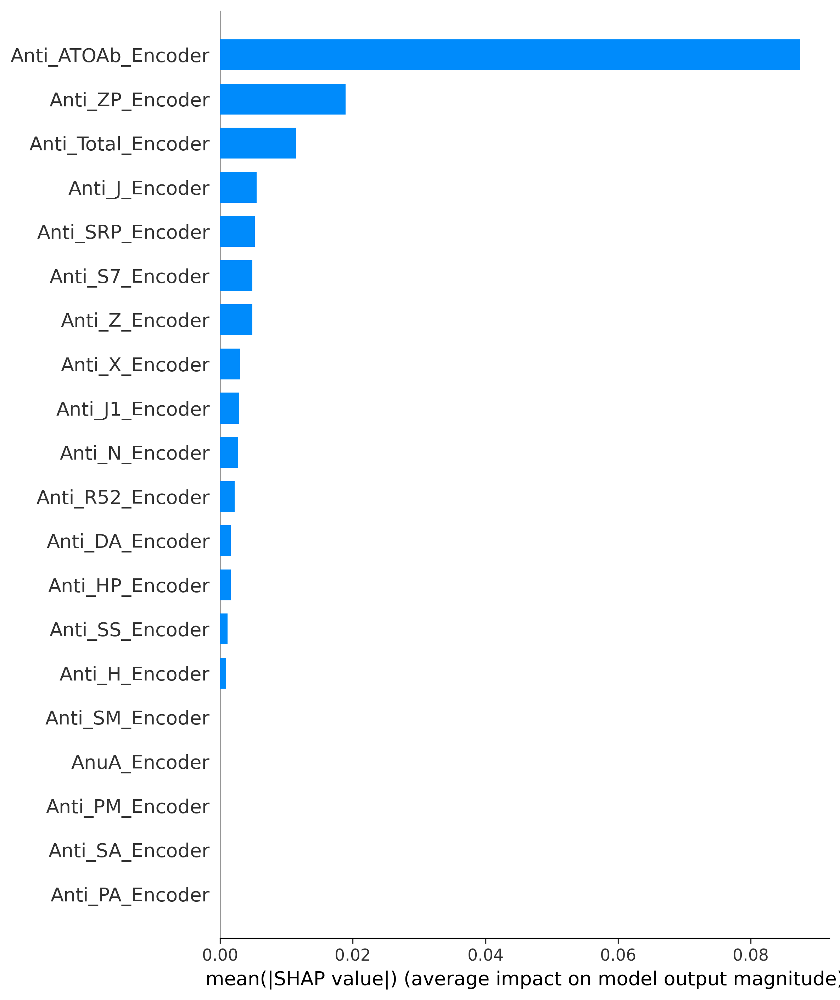

In [66]:
#SHAP计算相关性特征
LoseCorr_Anti=shap.TreeExplainer(XGBoost_Lose)
Lose_shap=LoseCorr_Anti.shap_values(Lose_Analysis_TestData)
plt.figure(dpi=300)
shap.summary_plot(Lose_shap,Lose_Analysis_TestData)
plt.show()
plt.figure(dpi=300)
shap.summary_plot(Lose_shap,Lose_Analysis_TestData,plot_type='bar')
plt.show()

构建机器学习模型和深度学习模型预测lose

In [67]:
#构建机器学习模型
PredictLose=['age']+list(Data.iloc[:,2:13].columns)    #获取基本数据
PredictLose_Data=Data.loc[:,PredictLose]    #获取值数据
PredictLose_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1554 entries, 0 to 1553
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             1554 non-null   int64  
 1   CD4/8           1554 non-null   float64
 2   CD3+_value      1554 non-null   float64
 3   CD3+CD8+value   1554 non-null   float64
 4   CD3+CD4+_value  1554 non-null   float64
 5   NK_value        1554 non-null   float64
 6   B_value         1554 non-null   float64
 7   CD3+%           1554 non-null   float64
 8   CD3+CD8+%       1554 non-null   float64
 9   CD3+CD4+%       1554 non-null   float64
 10  NK%             1554 non-null   float64
 11  B%              1554 non-null   float64
dtypes: float64(11), int64(1)
memory usage: 145.8 KB


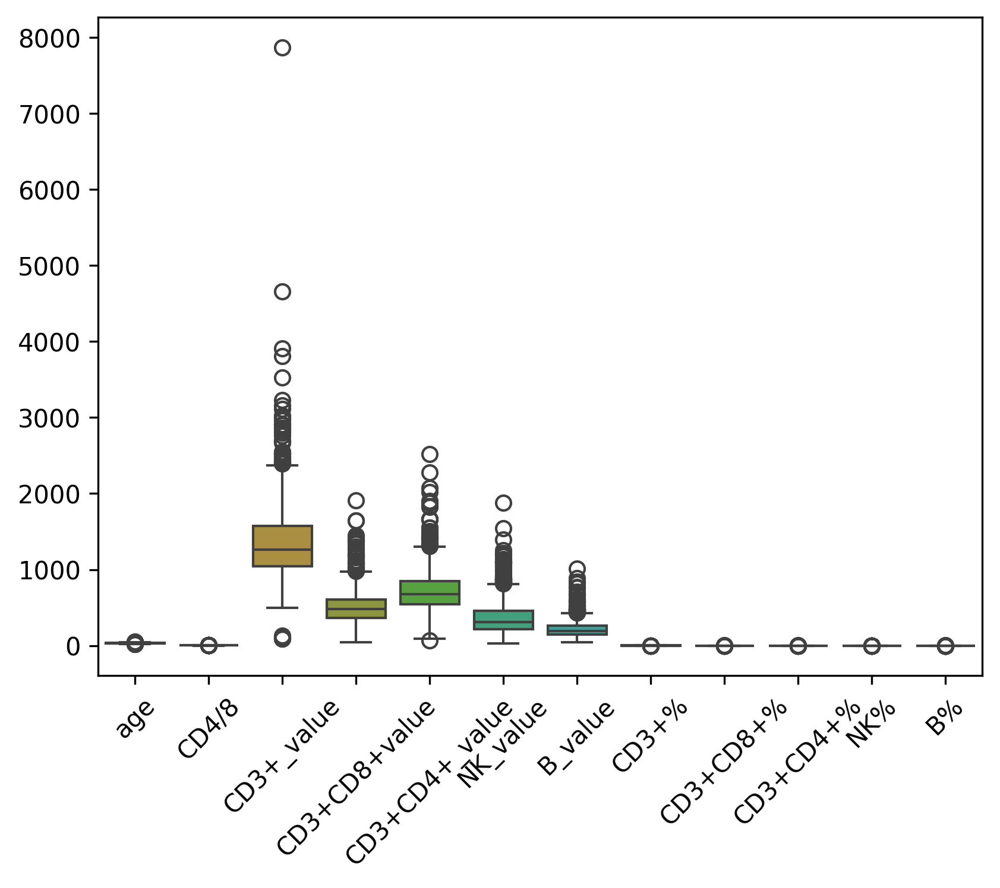

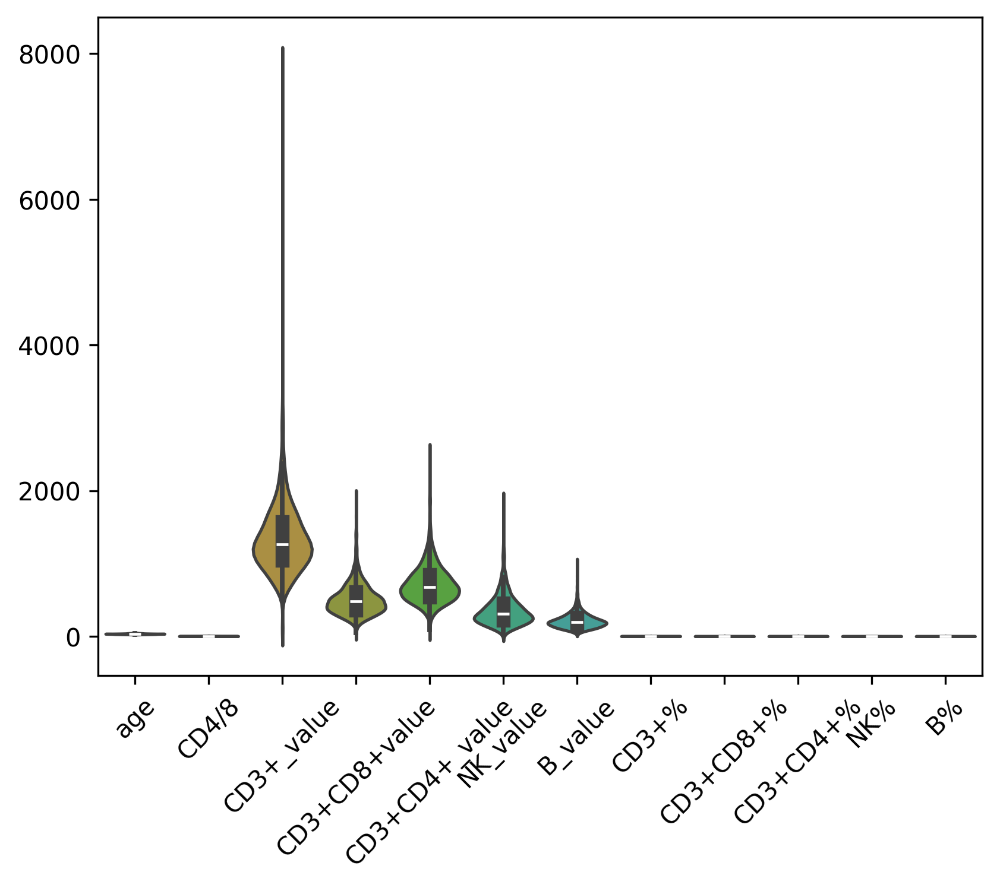

In [68]:
#绘制箱型图和小提琴图
plt.figure(dpi=300)
sns.boxplot(PredictLose_Data)
plt.xticks(rotation=45)
plt.show()
plt.figure(dpi=300)
sns.violinplot(PredictLose_Data)
plt.xticks(rotation=45)
plt.show()

In [69]:
#标准化和缩放数据集
from sklearn.preprocessing import StandardScaler,MinMaxScaler
stand=StandardScaler()    #初始化缩放器
PredictLose_DataStand=stand.fit_transform(PredictLose_Data)    #数据缩放
minmax=MinMaxScaler(feature_range=(0,1))    #设置归一化器
PredictLose_DataStandMinmax=minmax.fit_transform(PredictLose_DataStand)
PredictLose_value=DataFrame(PredictLose_DataStandMinmax)    #重构数据集
PredictLose_value.columns=PredictLose_Data.columns

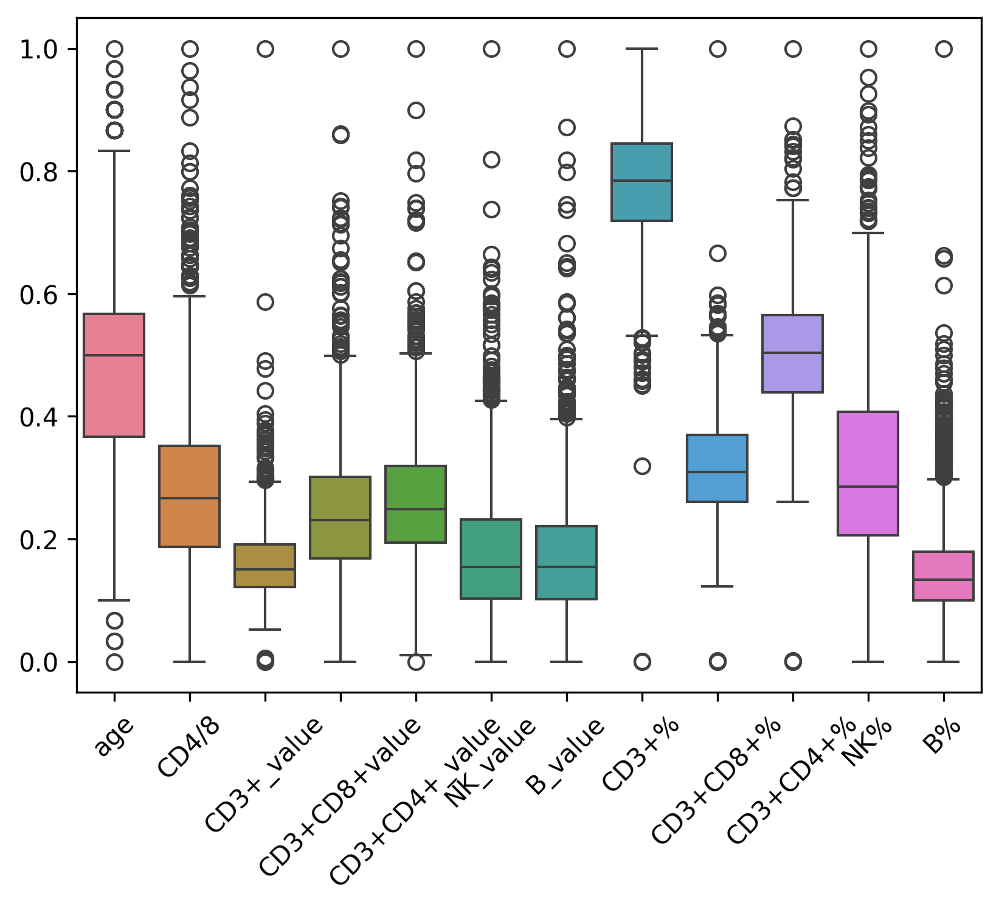

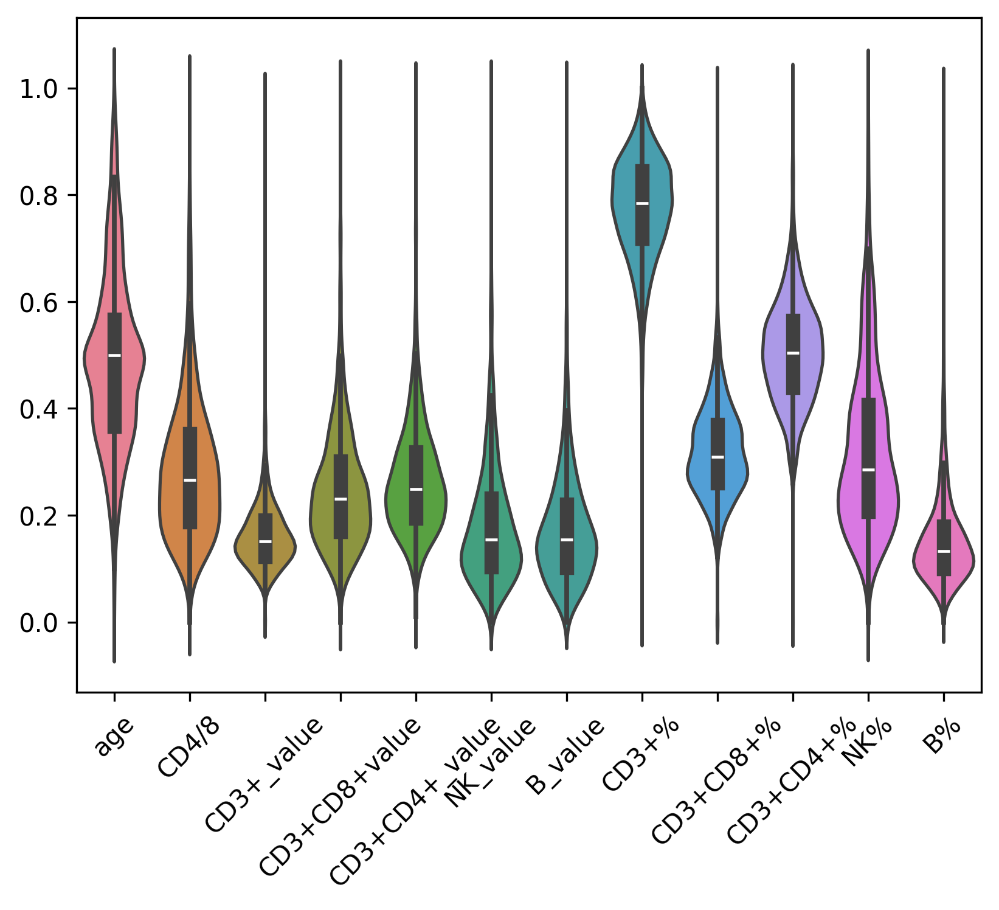

In [70]:
#绘制箱型图和小提琴图
plt.figure(dpi=300)
sns.boxplot(PredictLose_value)
plt.xticks(rotation=45)
plt.show()
plt.figure(dpi=300)
sns.violinplot(PredictLose_value)
plt.xticks(rotation=45)
plt.show()

In [71]:
#连接抗体数据
for anti in Data.iloc[:,35:]:
    PredictLose_value[anti]=Data.loc[:,anti]
PredictLose_value.head(10)

,age,CD4/8,CD3+_value,CD3+CD8+value,CD3+CD4+_value,NK_value,B_value,CD3+%,CD3+CD8+%,CD3+CD4+%,...,Anti_PA_Encoder,Anti_CPB_Encoder,Anti_SRP_Encoder,Anti_R52_Encoder,Anti_SS_Encoder,Anti_J1_Encoder,Anti_DA_Encoder,Anti_SM_Encoder,Anti_PM_Encoder,AnuA_Encoder
0,0.466667,0.151242,0.351845,0.694788,0.496743,0.114177,0.033058,1.000000,0.516043,0.550507,...,0,0,0,0.0,0,0,0,0,0,0
1,0.433333,0.203160,0.196169,0.333154,0.297231,0.017857,0.255165,0.910710,0.408821,0.541949,...,0,0,0,0.0,0,0,0,0,0,0
2,0.500000,0.237020,0.115053,0.186459,0.188925,0.346320,0.018595,0.635781,0.277165,0.413173,...,0,0,0,0.0,0,0,0,0,0,0
3,0.333333,0.218962,0.107854,0.168726,0.159609,0.123377,0.001033,0.837776,0.353752,0.497530,...,0,0,0,0.0,0,0,0,0,0,0
4,0.700000,0.237020,0.150919,0.250940,0.254479,0.319264,0.029959,0.716557,0.316917,0.473758,...,0,0,0,0.0,0,1,0,0,0,0
5,0.433333,0.187359,0.121095,0.219774,0.181189,0.139069,0.007231,0.837664,0.403108,0.500654,...,1,0,0,0.0,0,0,0,0,0,0
6,0.466667,0.218962,0.135236,0.242343,0.229235,0.184524,0.016529,0.805735,0.382563,0.536244,...,0,0,0,0.0,0,0,0,0,0,0
7,0.500000,0.169300,0.175472,0.293391,0.224349,0.227814,0.037190,0.812905,0.360803,0.416026,...,0,0,0,0.0,1,0,0,0,0,0
8,0.566667,0.284424,0.192184,0.280494,0.333876,0.030303,0.158058,0.938830,0.366638,0.634863,...,0,0,0,0.0,0,0,0,0,0,0
9,0.266667,0.185102,0.176629,0.318646,0.261808,0.369048,0.056818,0.713980,0.339893,0.417792,...,0,0,0,0.0,0,0,0,0,0,0


In [72]:
#切分数据集
LoseData=Data.loc[:,'lose']
Lose_TrainData,Lose_TestData,Lose_Trainlabel,Lose_Testlabel=train_test_split(PredictLose_value,LoseData,
                                                                            train_size=0.7,random_state=2024)
print('流产次数分析训练数据集规模为:{0},测试数据集规模为:{1}'.format(Lose_TrainData.shape,Lose_TestData.shape))
print('流产次数分析训练数据集标签规模为:{0},测试数据集标签规模为:{1}'.format(Lose_Trainlabel.shape,Lose_Testlabel.shape))

流产次数分析训练数据集规模为:(1087, 34),测试数据集规模为:(467, 34)
流产次数分析训练数据集标签规模为:(1087,),测试数据集标签规模为:(467,)


In [73]:
#载入并训练XGBoost模型
XGBoostLose=xgboost.XGBRegressor(booster='gbtree',objective='reg:squarederror',n_estimators=9,
                                  min_child_weight=0.1,max_depth=3,tree_method='gpu_hist',n_jobs=-1,
                                 random_state=2024)
XGBoostLose.fit(Lose_TrainData,Lose_Trainlabel)

/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:04:56] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=0.1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=9, n_jobs=-1,
             num_parallel_tree=None, random_state=2024, ...)

In [136]:
joblib.dump(XGBoostLose,'/mnt/workspace/ML_Model/ML_Models_lose/XGBoostLose.pkl')

['/mnt/workspace/ML_Model/ML_Models_lose/XGBoostLose.pkl']

In [74]:
Model_Error(Lose_TrainData,Lose_TestData,Lose_Trainlabel,Lose_Testlabel,XGBoostLose)

模型训练MSE为:0.9237643913122484,模型测试MSE为:1.0390083915196682
模型训练MAE为:0.5927709459490806,模型测试MAE为:0.6440460600230117


/home/pai/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning: [11:05:00] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


In [75]:
#输出SHAP特征重要性
LoseExplainer=shap.TreeExplainer(XGBoostLose)    #初始化解释器
LoseExplainer_shap=LoseExplainer.shap_values(Lose_TestData)    #计算SHAP值
LoseExplainer_expeted_value=LoseExplainer.expected_value    #计算Expeted_value

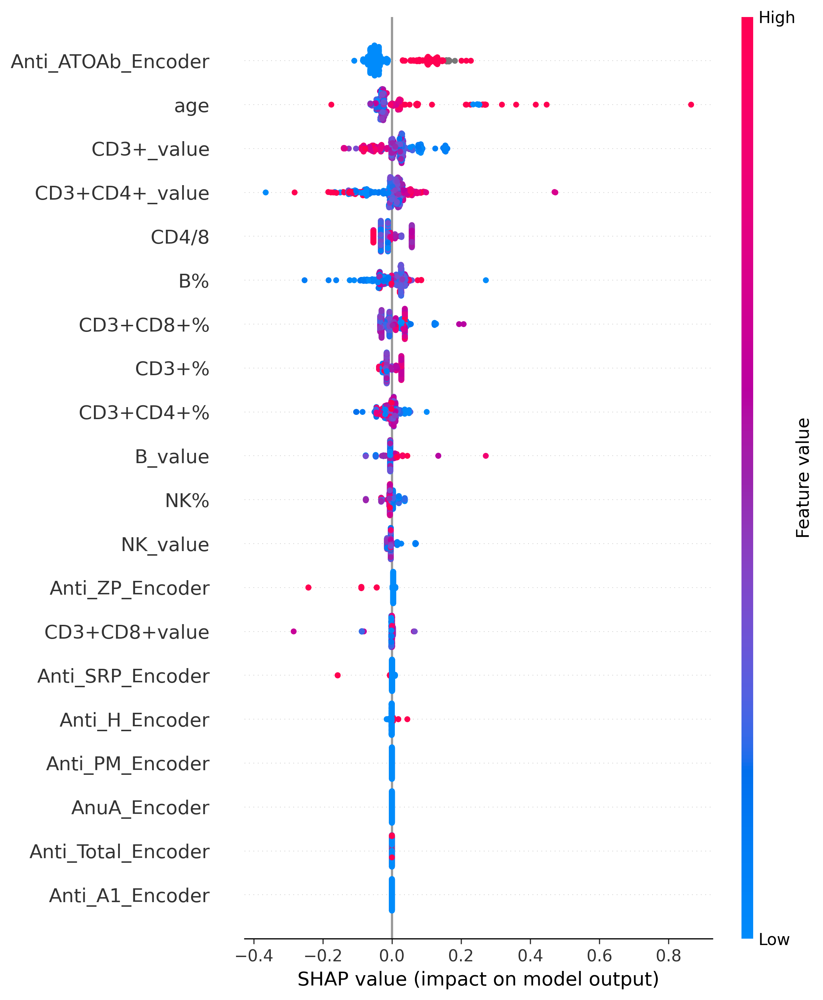

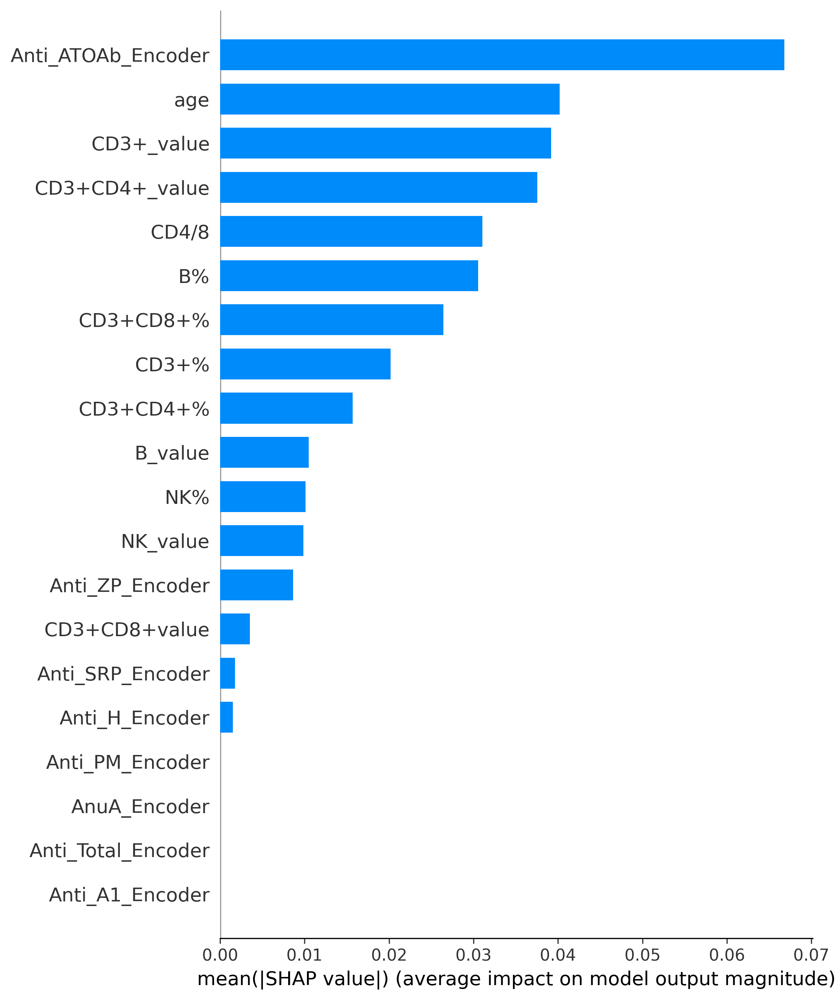

In [76]:
#绘制summary_plot
plt.figure(dpi=300)
shap.summary_plot(LoseExplainer_shap,Lose_TestData)
plt.show()
plt.figure(dpi=300)
shap.summary_plot(LoseExplainer_shap,Lose_TestData,plot_type='bar')
plt.show()

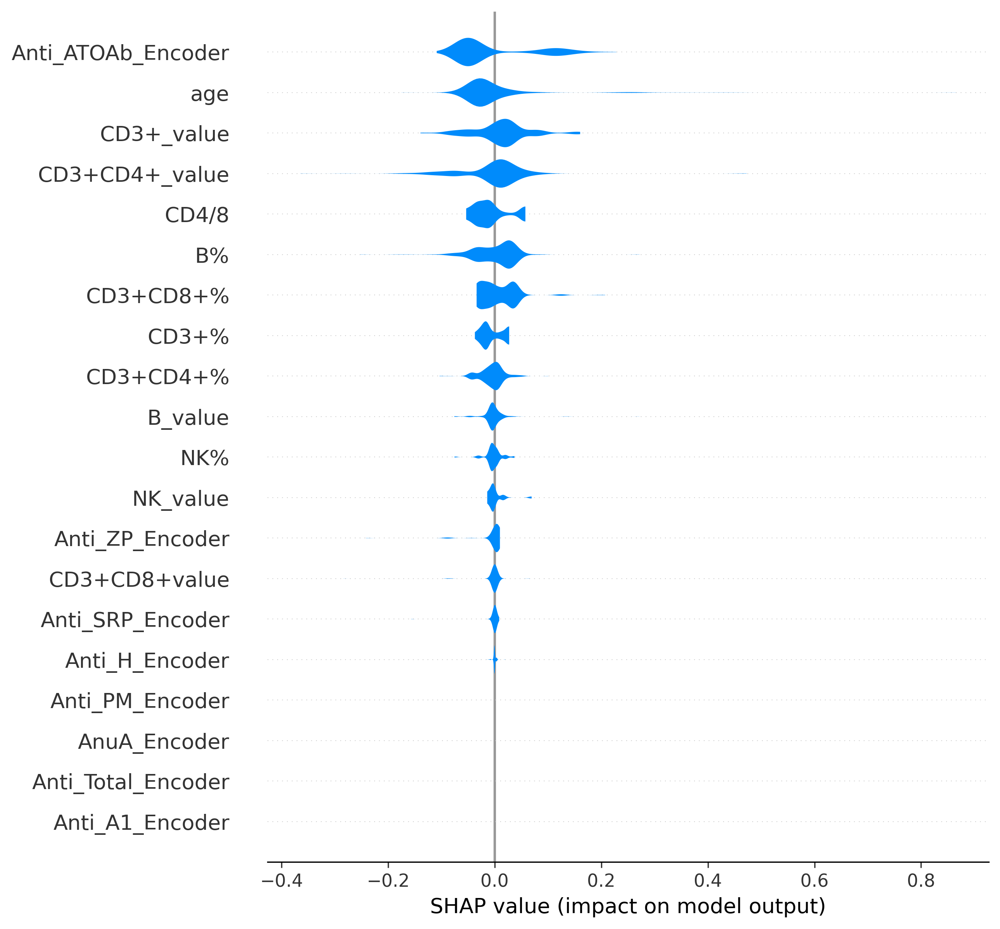

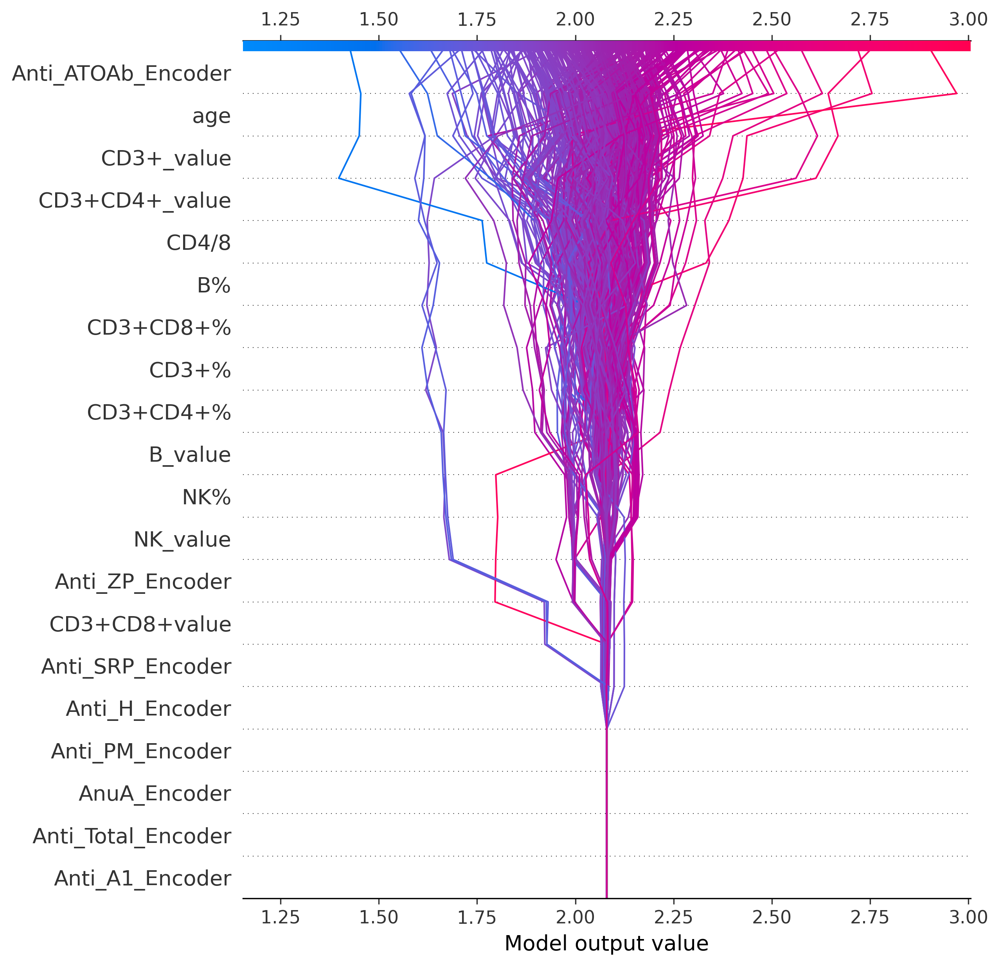

In [77]:
#绘制violinplot和decision图
plt.figure(dpi=300)    #绘制violinplot图
shap.violin_plot(LoseExplainer_shap,Lose_TestData.columns)
plt.show()
plt.figure(dpi=300)
shap.decision_plot(LoseExplainer_expeted_value,LoseExplainer_shap,Lose_TestData.columns)
plt.show()

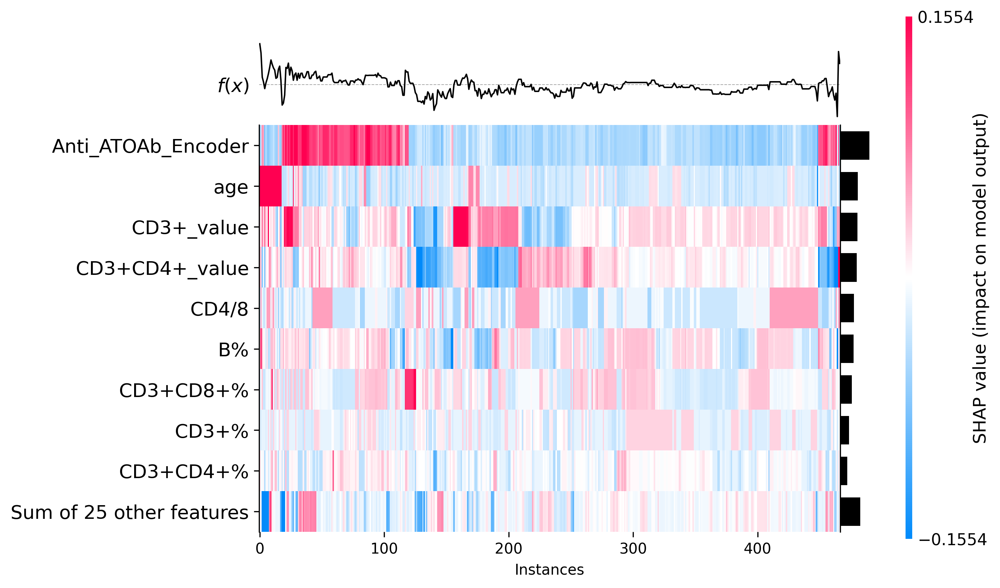

In [78]:
#绘制热力图
plt.figure(dpi=300)
shap.plots.heatmap(LoseExplainer(Lose_TestData))
plt.show()

In [ ]:
#绘制froce_plot
shap.initjs()
shap.force_plot(LoseExplainer_expeted_value,LoseExplainer_shap,Lose_TestData)

计算是否添加常规数据对流产预测的影响程度

In [80]:
#构建预测数据
ModelPredict_Data=DataFrame()
ModelPredict_Data['Anti Predict']=XGBoost_Lose.predict(Lose_Analysis_TestData)    #获取Anti数据
ModelPredict_Data['Anti_Inspection Predict']=XGBoostLose.predict(Lose_TestData)    #获取Anti和检验数据预测结果

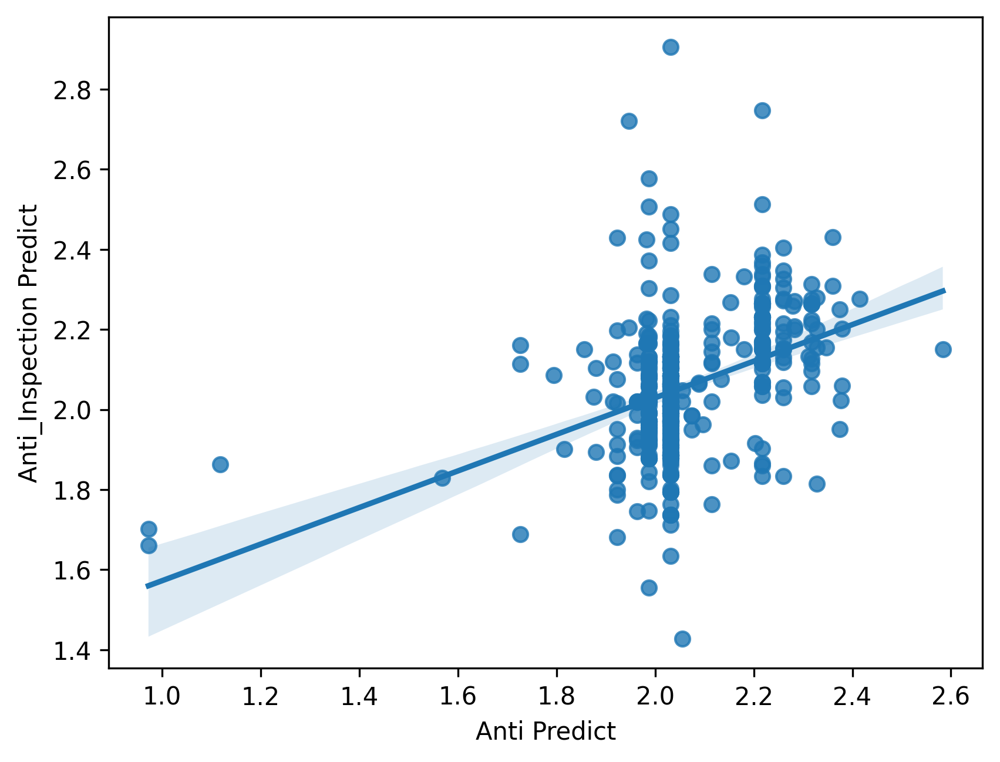

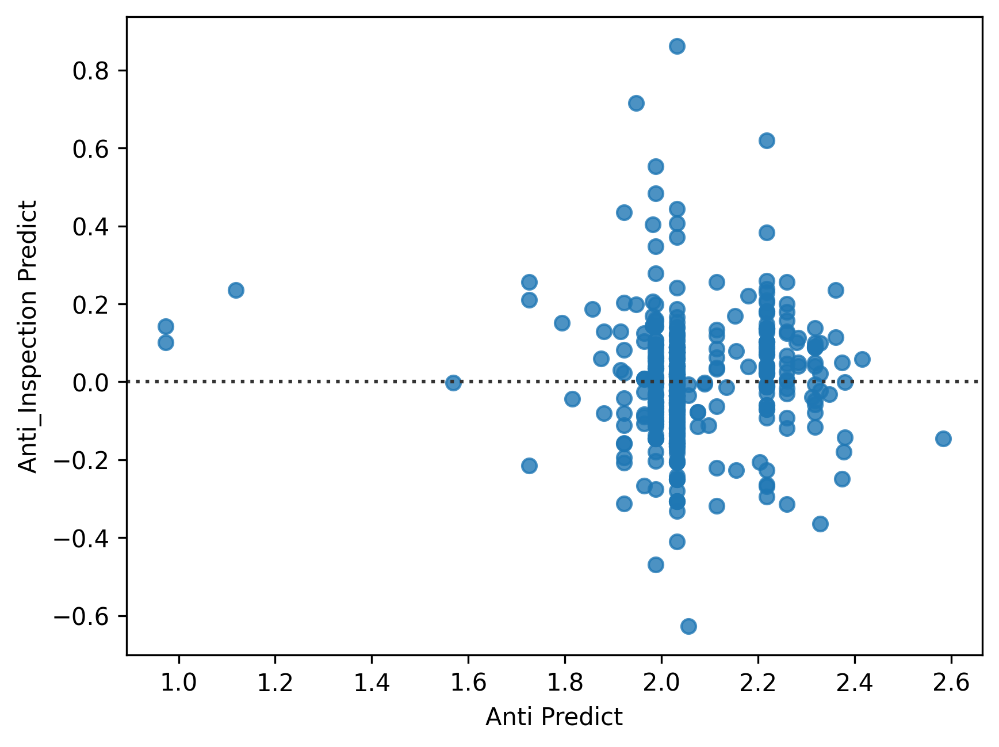

In [81]:
#绘制回归和残差图
plt.figure(dpi=300)
sns.regplot(x='Anti Predict',y='Anti_Inspection Predict',data=ModelPredict_Data)
plt.show()
plt.figure(dpi=300)
sns.residplot(x='Anti Predict',y='Anti_Inspection Predict',data=ModelPredict_Data)
plt.show()

In [82]:
#正态检验
for target in ModelPredict_Data.columns:
    normltest_stats,normaltest_pvalue=normaltest(ModelPredict_Data[target])
    print('{0}正态检验结果为:{1},P值为{2}'.format(target,normltest_stats,normaltest_pvalue))

Anti Predict正态检验结果为:264.0399641566347,P值为4.6179612293049746e-58
Anti_Inspection Predict正态检验结果为:59.59262215541071,P值为1.1471666632585112e-13


In [83]:
#进行差异分析
#原假设，认为第一组的中位数小于第二组的中位数
mannwhitneyU_stats,mannwhitneyU_pvalue=mannwhitneyu(ModelPredict_Data.loc[:,'Anti Predict'],
                                                    ModelPredict_Data.loc[:,'Anti_Inspection Predict'],alternative='greater')
print('是否添加常规检验数据Mann-Whitney U检验统计量为:{0},P值为:{1}'.format(mannwhitneyU_stats,mannwhitneyU_pvalue))

是否添加常规检验数据Mann-Whitney U检验统计量为:112052.0,P值为:0.2312146971803135


使用深度学习预测lose

In [84]:
#构建深度学习数据集
DLData,DL_TestData,DLTarget,DL_TestTarget=train_test_split(PredictLose_value,LoseData,train_size=0.8,random_state=2024)
DL_TrainData=DLData[:932]    #获取训练数据
DL_TrainTarget=DLTarget[:932]
DL_ValidData=DLData[932:]    #获取验证数据
DL_ValidTarget=DLTarget[932:]
print('深度学习训练数据形状:{0},验证数据形状:{1},测试数据形状:{2}'.format(DL_TrainData.shape,DL_ValidData.shape,DL_TestData.shape))
print('深度学习训练数据标签形状:{0},验证数据标签形状:{1},测试数据标签形状:{2}'.format(DL_TrainTarget.shape,DL_ValidTarget.shape,DL_TestTarget.shape))

深度学习训练数据形状:(932, 34),验证数据形状:(311, 34),测试数据形状:(311, 34)
深度学习训练数据标签形状:(932,),验证数据标签形状:(311,),测试数据标签形状:(311,)


In [85]:
#提取抗体和检验数据
DLTrain_Inspection=DL_TrainData.iloc[:,:12]    #检验数据集-训练
DLTrain_Anti=DL_TrainData.iloc[:,12:]    #抗体数据集-训练
DLValid_Inspection=DL_ValidData.iloc[:,:12]    #检验数据集-验证
DLValid_Anti=DL_ValidData.iloc[:,12:]   #抗体数据集-验证
DLTest_Inspection=DL_TestData.iloc[:,:12]    #检验数据集-测试
DLTest_Anti=DL_TestData.iloc[:,12:]    #抗体数据集-测试

In [86]:
#填充空缺数据
DLTrain_Anti.fillna(0,inplace=True)
DLValid_Anti.fillna(0,inplace=True)
DLTest_Anti.fillna(0,inplace=True)

In [ ]:
#构建数据输入流
import tensorflow as tf
DL_TrainData_inspection=tf.data.Dataset.from_tensor_slices((DLTrain_Inspection)).repeat(10)    #构建检验训练数据流
DL_TrainData_inspection=DL_TrainData_inspection.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
DL_TrainData_Anti=tf.data.Dataset.from_tensor_slices((DLTrain_Anti)).repeat(10)    #构建抗体训练数据流
DL_TrainData_Anti=DL_TrainData_Anti.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
DL_TrainTarget_API=tf.data.Dataset.from_tensor_slices((DL_TrainTarget)).repeat(10)    #构建训练标签数据流
DL_TrainTarget_API=DL_TrainTarget_API.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
#构建验证数据流
DL_ValidData_inspection=tf.data.Dataset.from_tensor_slices((DLValid_Inspection)).repeat(10)    #构建检验数据流
DL_ValidData_inspection=DL_ValidData_inspection.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
DL_ValidData_Anti=tf.data.Dataset.from_tensor_slices((DLValid_Anti)).repeat(10)    #构建抗体验证数据流
DL_ValidData_Anti=DL_ValidData_Anti.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
DL_ValidTarget_API=tf.data.Dataset.from_tensor_slices((DL_ValidTarget)).repeat(10)    #构建验证标签数据流
DL_ValidTarget_API=DL_ValidTarget_API.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
#构建测试数据流
DL_TestData_inspection=tf.data.Dataset.from_tensor_slices((DLTest_Inspection)).repeat(10)    #构建检验测试数据流
DL_TestData_inspection=DL_TestData_inspection.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
DL_TestData_Anti=tf.data.Dataset.from_tensor_slices((DLTest_Anti)).repeat(10)    #构建抗体测试数据流
DL_TestData_Anti=DL_TestData_Anti.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)
DL_TestTarget_API=tf.data.Dataset.from_tensor_slices((DL_TestTarget)).repeat(10)    #构建测试标签数据流
DL_TestTarget_API=DL_TestTarget_API.shuffle(buffer_size=1000,seed=2024).batch(32).prefetch(tf.data.experimental.AUTOTUNE)

In [118]:
#模型组网
from tensorflow import keras
InputLayer_inspection=keras.layers.Input(shape=[12],name='Inspection_input')
#组合体1-检验数据
Inspection_Dense1_1=keras.layers.Dense(12,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(InputLayer_inspection)
Inspection_Dense1_2=keras.layers.Dense(24,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dense1_1)
Inspection_Normal1=keras.layers.BatchNormalization()(Inspection_Dense1_2)
Inspection_Dropout1=keras.layers.Dropout(rate=0.5)(Inspection_Normal1)
#组合体2-检验数据
Inspection_Dense2_1=keras.layers.Dense(36,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dropout1)
Inspection_Dense2_2=keras.layers.Dense(36,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dense2_1)
Inspection_Normal2=keras.layers.BatchNormalization()(Inspection_Dense2_2)
Inspection_Dropout2=keras.layers.Dropout(rate=0.5)(Inspection_Normal2)
#组合体3-检验数据
Inspection_Dense3_1=keras.layers.Dense(48,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dropout2)
Inspection_Dense3_2=keras.layers.Dense(48,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dense3_1)
Inspection_Normal3=keras.layers.BatchNormalization()(Inspection_Dense3_2)
Inspection_Dropout3=keras.layers.Dropout(rate=0.5)(Inspection_Normal3)
#组合体4-检验数据
Inspection_Dense4_1=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dropout3)
Inspection_Dense4_2=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dense4_1)
#构建抗体数据输入
InputLayer_Anti=keras.layers.Input(shape=[22],name='Anti_input')
#组合体1-抗体数据
Anti_Dense1_1=keras.layers.Dense(22,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(InputLayer_Anti)
Anti_Dense1_2=keras.layers.Dense(24,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense1_1)
Anti_Normal1=keras.layers.BatchNormalization()(Anti_Dense1_2)
Anti_Dropout1=keras.layers.Dropout(rate=0.5)(Anti_Normal1)
#组合体2-抗体数据
Anti_Dense2_1=keras.layers.Dense(36,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dropout1)
Anti_Dense2_2=keras.layers.Dense(36,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense2_1)
Anti_Normal2=keras.layers.BatchNormalization()(Anti_Dense2_2)
Anti_Dropout2=keras.layers.Dropout(rate=0.5)(Anti_Normal2)
#组合体3-抗体数据
Anti_Dense3_1=keras.layers.Dense(48,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dropout2)
Anti_Dense3_2=keras.layers.Dense(48,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense3_1)
Anti_Normal3=keras.layers.BatchNormalization()(Anti_Dense3_2)
Anti_Dropout3=keras.layers.Dropout(rate=0.5)(Anti_Normal3)
#组合体4-抗体数据
Anti_Dense4_1=keras.layers.Dense(60,activation='sigmoid',kernel_initializer='he_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dropout3)
Anti_Dense4_2=keras.layers.Dense(60,activation='sigmoid',kernel_initializer='he_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense4_1)
#数据合并层
Content_layer=keras.layers.Concatenate()([Inspection_Dense4_2, Anti_Dense4_2])
#残差模块1
Res_Dense1_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Content_layer)
Res_Dense1_2=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense1_1)
Res_Dense1_3=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense1_2)
Res_Add1=keras.layers.Add()([Res_Dense1_3,Content_layer])
Res_Normal1=keras.layers.Normalization()(Res_Add1)
#残差模块2
Res_Dense2_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal1)
Res_Dense2_2=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense2_1)
Res_Dense2_3=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense2_2)
Res_Add2=keras.layers.Add()([Res_Dense2_3,Res_Normal1])
Res_Normal2=keras.layers.Normalization()(Res_Add2)
#残差模块3
Res_Dense3_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal2)
Res_Dense3_2=keras.layers.Dense(40,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense3_1)
Res_Dense3_3=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense3_2)
Res_Add3=keras.layers.Add()([Res_Dense3_3,Res_Normal2])
Res_Normal3=keras.layers.Normalization()(Res_Add3)
#残差模块4
Res_Dense4_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal3)
Res_Dense4_2=keras.layers.Dense(30,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense4_1)
Res_Dense4_3=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense4_2)
Res_Add4=keras.layers.Add()([Res_Dense4_3,Res_Normal3])
Res_Normal4=keras.layers.Normalization()(Res_Add4)
#前馈网络
Hidden_Layer1=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal4)
Hidden_Normal=keras.layers.Normalization()(Hidden_Layer1)
Hidden_Layer2=keras.layers.Dense(30,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Hidden_Normal)
Hidden_Layer3=keras.layers.Dense(10,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Hidden_Layer2)
Output_layer=keras.layers.Dense(1,name='Output_layer')(Hidden_Layer3)    #输出层
AntiAndInspection=keras.Model(inputs=[InputLayer_inspection,InputLayer_Anti],outputs=[Output_layer])    #模型组网
AntiAndInspection.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Inspection_input (InputLayer)  [(None, 12)]         0           []                               
                                                                                                  
 Anti_input (InputLayer)        [(None, 22)]         0           []                               
                                                                                                  
 dense_413 (Dense)              (None, 12)           156         ['Inspection_input[0][0]']       
                                                                                                  
 dense_421 (Dense)              (None, 22)           506         ['Anti_input[0][0]']             
                                                                                            

In [112]:
#填充空缺数据
DLTrain_Anti_Re=np.array(DLTrain_Anti).reshape(DLTrain_Anti.shape[0],DLTrain_Anti.shape[1],1)    #抗体数据
DLValid_Anti_Re=np.array(DLValid_Anti).reshape(DLValid_Anti.shape[0],DLValid_Anti.shape[1],1)
DLTest_Anti_Re=np.array(DLTest_Anti).reshape(DLTest_Anti.shape[0],DLTest_Anti.shape[1],1)
DLTrain_Inspection_Re=np.array(DLTrain_Inspection).reshape(DLTrain_Inspection.shape[0],DLTrain_Inspection.shape[1],1)    #检验数据
DLValid_Inspection_Re=np.array(DLValid_Inspection).reshape(DLValid_Inspection.shape[0],DLValid_Inspection.shape[1],1)
DLTest_Inspection_Re=np.array(DLTest_Inspection).reshape(DLTest_Inspection.shape[0],DLTest_Inspection.shape[1],1)

In [157]:
InputLayer_inspection=keras.layers.Input(shape=[12,1],name='Inspection_input')
#卷积层-检验数据1
Inspection_Conv1D1_1=keras.layers.Conv1D(filters=24,kernel_size=3,padding='valid',activation='selu',strides=1,kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(InputLayer_inspection)
Inspection_Conv1D1_2=keras.layers.Conv1D(filters=24,kernel_size=3,padding='valid',activation='selu',strides=1,kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Conv1D1_1)
Inspection_maxpool1=keras.layers.MaxPooling1D(pool_size=2,strides=1,padding='valid')(Inspection_Conv1D1_2)
#卷积层-检验数据
Inspection_Conv1D2_1=keras.layers.Conv1D(filters=48,kernel_size=3,padding='valid',activation='selu',strides=1,kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_maxpool1)
Inspection_Conv1D2_2=keras.layers.Conv1D(filters=48,kernel_size=3,padding='valid',activation='selu',strides=1,kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Conv1D2_1)
Inspection_maxpool2=keras.layers.MaxPooling1D(pool_size=2,strides=1,padding='valid')(Inspection_Conv1D2_2)
Inspection_Flatten=keras.layers.Flatten()(Inspection_maxpool2)
#组合体1-检验数据
Inspection_Dense1_1=keras.layers.Dense(96,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Flatten)
Inspection_Dense1_2=keras.layers.Dense(96,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dense1_1)
Inspection_Normal1=keras.layers.BatchNormalization()(Inspection_Dense1_2)
Inspection_Dropout1=keras.layers.Dropout(rate=0.5)(Inspection_Normal1)
#组合体2-检验数据
Inspection_Dense2_1=keras.layers.Dense(192,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dropout1)
Inspection_Dense2_2=keras.layers.Dense(192,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Inspection_Dense2_1)
Inspection_Normal2=keras.layers.BatchNormalization()(Inspection_Dense2_2)
#构建抗体数据输入
InputLayer_Anti=keras.layers.Input(shape=[22],name='Anti_input')
#组合体1-抗体数据
Anti_Dense1_1=keras.layers.Dense(22,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(InputLayer_Anti)
Anti_Dense1_2=keras.layers.Dense(24,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense1_1)
Anti_Normal1=keras.layers.BatchNormalization()(Anti_Dense1_2)
Anti_Dropout1=keras.layers.Dropout(rate=0.5)(Anti_Normal1)
#组合体2-抗体数据
Anti_Dense2_1=keras.layers.Dense(36,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dropout1)
Anti_Dense2_2=keras.layers.Dense(36,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense2_1)
Anti_Normal2=keras.layers.BatchNormalization()(Anti_Dense2_2)
Anti_Dropout2=keras.layers.Dropout(rate=0.5)(Anti_Normal2)
#组合体3-抗体数据
Anti_Dense3_1=keras.layers.Dense(48,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dropout2)
Anti_Dense3_2=keras.layers.Dense(48,activation='sigmoid',kernel_initializer='glorot_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense3_1)
Anti_Normal3=keras.layers.BatchNormalization()(Anti_Dense3_2)
Anti_Dropout3=keras.layers.Dropout(rate=0.5)(Anti_Normal3)
#组合体4-抗体数据
Anti_Dense4_1=keras.layers.Dense(60,activation='sigmoid',kernel_initializer='he_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dropout3)
Anti_Dense4_2=keras.layers.Dense(60,activation='sigmoid',kernel_initializer='he_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Anti_Dense4_1)
Inspection_Reshape=keras.layers.Reshape((-1,))(Anti_Dense4_2)
#数据合并层
Content_layer=keras.layers.Concatenate()([Inspection_Normal2,Inspection_Reshape])
#残差模块1
Res_Dense1_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Content_layer)
Res_Dense1_2=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense1_1)
Res_Dense1_3=keras.layers.Dense(252,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense1_2)
Res_Add1=keras.layers.Add()([Res_Dense1_3,Content_layer])
Res_Normal1=keras.layers.Normalization()(Res_Add1)
#残差模块2
Res_Dense2_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal1)
Res_Dense2_2=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense2_1)
Res_Dense2_3=keras.layers.Dense(252,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense2_2)
Res_Add2=keras.layers.Add()([Res_Dense2_3,Res_Normal1])
Res_Normal2=keras.layers.Normalization()(Res_Add2)
#残差模块3
Res_Dense3_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal2)
Res_Dense3_2=keras.layers.Dense(40,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense3_1)
Res_Dense3_3=keras.layers.Dense(252,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense3_2)
Res_Add3=keras.layers.Add()([Res_Dense3_3,Res_Normal2])
Res_Normal3=keras.layers.Normalization()(Res_Add3)
#残差模块4
Res_Dense4_1=keras.layers.Dense(120,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal3)
Res_Dense4_2=keras.layers.Dense(30,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense4_1)
Res_Dense4_3=keras.layers.Dense(252,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Dense4_2)
Res_Add4=keras.layers.Add()([Res_Dense4_3,Res_Normal3])
Res_Normal4=keras.layers.Normalization()(Res_Add4)
#前馈网络
Hidden_Layer1=keras.layers.Dense(60,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Res_Normal4)
Hidden_Layer2=keras.layers.Dense(40,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))((Hidden_Layer1))
Hidden_Normal=keras.layers.Normalization()(Hidden_Layer2)
Hidden_Layer3=keras.layers.Dense(30,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Hidden_Normal)
Hidden_Layer4=keras.layers.Dense(10,activation='selu',kernel_initializer='lecun_normal',kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),
                   kernel_constraint=keras.constraints.max_norm(1))(Hidden_Layer3)
Output_layer=keras.layers.Dense(1,name='Output_layer')(Hidden_Layer4)    #输出层
AntiAndInspection=keras.Model(inputs=[InputLayer_inspection,InputLayer_Anti],outputs=[Output_layer])    #模型组网
AntiAndInspection.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Anti_input (InputLayer)        [(None, 22)]         0           []                               
                                                                                                  
 Inspection_input (InputLayer)  [(None, 12, 1)]      0           []                               
                                                                                                  
 dense_667 (Dense)              (None, 22)           506         ['Anti_input[0][0]']             
                                                                                                  
 conv1d_86 (Conv1D)             (None, 10, 24)       96          ['Inspection_input[0][0]']       
                                                                                           

In [91]:
#检测GPU可用性
import tensorflow as tf
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [ ]:
#编译及训练
Train_epoch=300
lr_scheduler=keras.callbacks.ReduceLROnPlateau(factor=0.5,patience=10)    #学习率性能调度
CheckPoint_model=keras.callbacks.ModelCheckpoint('AntiAndInspection',save_best_only=True)    #设置检查点
EarlyStopping_model=keras.callbacks.EarlyStopping(patience=100,restore_best_weights=True)    #设置提前停止
AntiAndInspection.compile(loss='mse',optimizer=keras.optimizers.Adam(learning_rate=0.01,clipnorm=1.0),metrics='mse')    #模型编译
TrainHistory=AntiAndInspection.fit(x={'Inspection_input':DLTrain_Inspection_Re,'Anti_input':DLTrain_Anti},
                                   y=DL_TrainTarget,epochs=Train_epoch,batch_size=32,
                                   validation_data=({'Inspection_input':DLValid_Inspection_Re,'Anti_input':DLValid_Anti},[DL_ValidTarget]),
                                  callbacks=[lr_scheduler,CheckPoint_model,EarlyStopping_model])

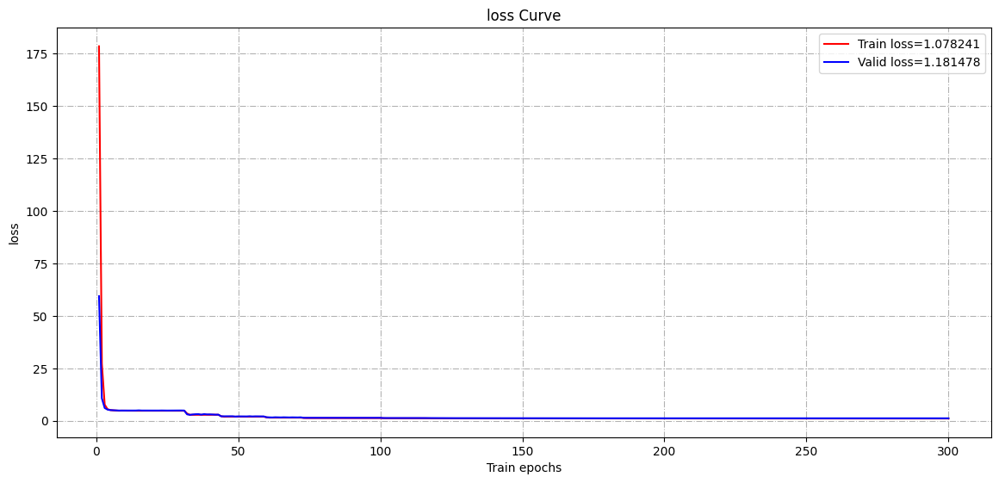

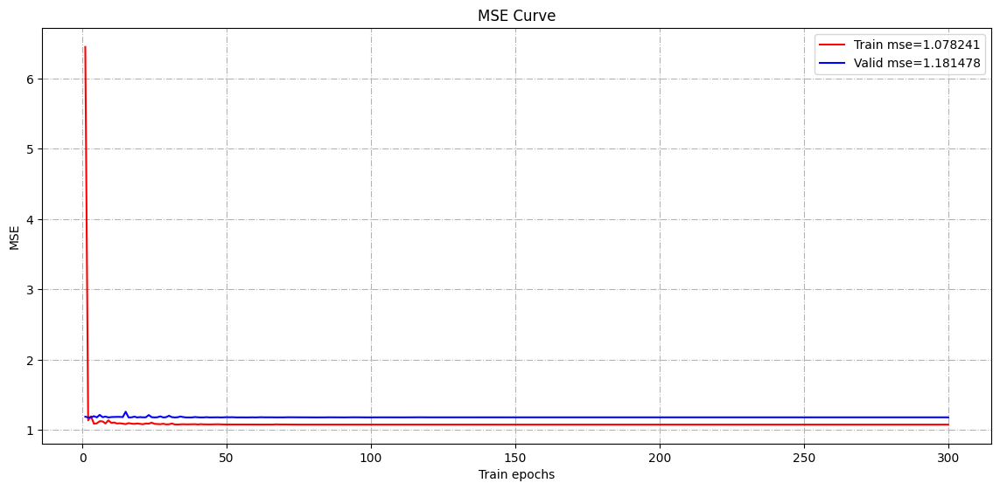

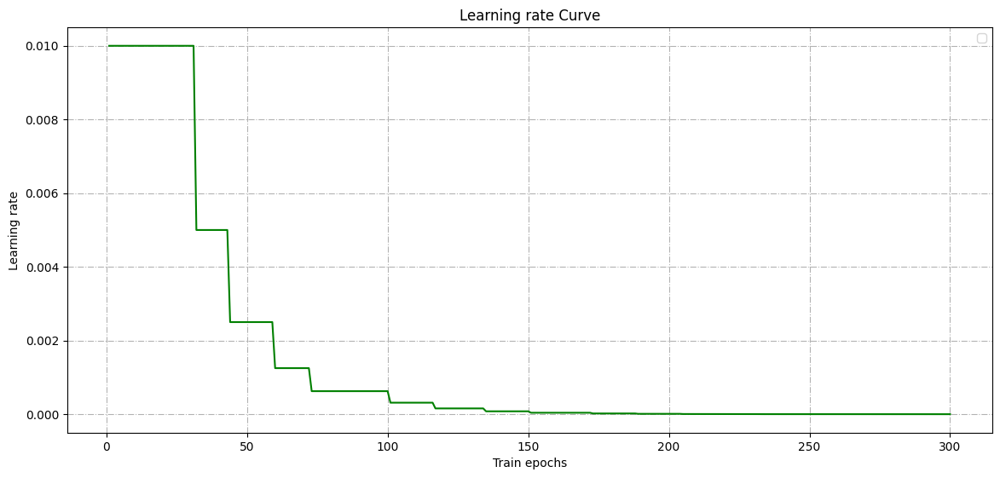

In [159]:
#绘制训练曲线
from pandas import DataFrame
TrainHistory=DataFrame(TrainHistory.history)
Epoch=TrainHistory.shape[0]
import numpy as np
fig=plt.figure(figsize=(14,21)) 
ax1=fig.add_subplot(311) #绘制误差曲线 
ax1.set_title('loss Curve') 
ax1.grid(color='black',linestyle='-.',alpha=0.3) 
ax1.plot(np.arange(1,Epoch+1),TrainHistory['loss'],
         color='red',linestyle='-',label='Train loss=%f'%TrainHistory.loc[Epoch-1,'loss']) 
ax1.plot(np.arange(1,Epoch+1),TrainHistory['val_loss'],
         color='blue',linestyle='-',label='Valid loss=%f'%TrainHistory.loc[Epoch-1,'val_loss']) 
ax1.set_xlabel('Train epochs') 
ax1.set_ylabel('loss') 
ax1.legend() 
fig2=plt.figure(figsize=(14,21)) 
ax2=fig2.add_subplot(312) #绘制精度曲线 
ax2.set_title('MSE Curve') 
ax2.grid(color='black',linestyle='-.',alpha=0.3) 
ax2.plot(np.arange(1,Epoch+1),TrainHistory['mse'],
         color='red',linestyle='-',label='Train mse=%f'%TrainHistory.loc[Epoch-1,'mse']) 
ax2.plot(np.arange(1,Epoch+1),TrainHistory['val_mse'],
         color='blue',linestyle='-',label='Valid mse=%f'%TrainHistory.loc[Epoch-1,'val_mse']) 
ax2.set_xlabel('Train epochs') 
ax2.set_ylabel('MSE') 
ax2.legend()
fig3=plt.figure(figsize=(14,21)) 
ax3=fig3.add_subplot(313) #绘制精度曲线 
ax3.set_title('Learning rate Curve') 
ax3.grid(color='black',linestyle='-.',alpha=0.3) 
ax3.plot(np.arange(1,Epoch+1),TrainHistory['lr'],color='green',linestyle='-') 
ax3.set_xlabel('Train epochs') 
ax3.set_ylabel('Learning rate') 
ax3.legend()

In [160]:
#评估模型
AntiAndInspection.evaluate({'Inspection_input':DLTest_Inspection_Re,'Anti_input':DLTest_Anti},[DL_TestTarget])

10/10 [==============================] - 0s 6ms/step - loss: 1.0287 - mse: 1.0287


[1.028655767440796, 1.0286554098129272]

In [ ]:
#保存模型
AntiAndInspection.save('/mnt/workspace/ML_Analysis/DeeplLearning_Models/AntiAndInspection.h5')
AntiAndInspection.save('/mnt/workspace/ML_Analysis/DeeplLearning_Models/AntiAndInspection')